<img src="https://algo-assets.amplifyme.com/quant/gresearch/Cointegration+Challenge.png" width="100%"/>

# Welcome to the Cointegration Challenge!
Welcome, to an intriguing journey into the world of cointegration and pairs trading in quantitative finance. Cointegration is a statistical phenomenon that uncovers long-term equilibrium relationships between time series variables, playing a vital role in strategies such as pairs trading, risk management, and portfolio optimization.

As we delve into this challenge, we will not only unravel the theory behind cointegration but also its practical implications in real-world finance. Our focus will be on mastering cointegration in the context of pairs trading, a market-neutral strategy that capitalises on the historical co-movement of assets. Pairs trading involves identifying and leveraging the relationship between two historically correlated assets, where their combined position is designed to be broadly market-neutral.

Here is where cointegration becomes a game-changer. Unlike correlation, which merely indicates the tendency of assets to move together, cointegration suggests a deeper, more stable relationship. In the realm of non-stationary time series data, which is characteristic of most financial markets, cointegration provides a more robust and statistically significant framework. This is vital in pairs trading, as it allows us to identify pairs of assets whose price movements are not just temporarily aligned but are likely to converge in the long run, despite short-term deviations. [Learn more about Cointegration here.](https://en.wikipedia.org/wiki/Cointegration)

Throughout this challenge, you will harness the power of Python and leverage essential libraries like pandas, numpy, and statsmodels to dissect, analyze, and model cointegrated time series.

## Challenge Overview
1. **OLS Regression:** Conduct an Ordinary Least Squares (OLS) regression, where the first difference of the series is regressed against its value and any differences. This aims to understand the relationship between the changes in the series and its past values.

2. **Augmented Dickey-Fuller:** Implement the Augmented Dickey-Fuller (ADF) test in order to determine the test statistic. This measures the importance of the level in explaining the changes in the series.

3. **Trading Bounds Analysis:** Determine the upper and lower trading bounds from the residuals, essential for developing a pairs trading strategy.

4. **Application Across Three Rounds:**
* **Round 1:** Apply your newfound knowledge to an initial dataset, analyzing results and making trading decisions.
* **Round 2:** Fine-tune your approach on a new unseen dataset, refining your strategy based on initial insights.
* **Round 3:** Test your refined strategy on a new, unseen dataset, putting your skills to the ultimate test.

## Assets Overview

You will have access to the following assets throughout the challenge.
1. Celestial Tech Enterprises (CTEN)
2. Oceanic Trade Networks (OTNW)
3. Zephyr Mobility Group (ZMG)
4. Etherwave Communications (ETWC)
5. Apex BioSolutions Inc. (ABSI)
6. Pinnacle Finance Collective (PFNC)
7. Infinite Realm Interactive (IRIN)
8. Cybernex Software Corp. (CNSC)
9. Pixelstream Graphics Ltd. (PXGL)
10. Starbound Motors Corp. (SBMC)

Whether you are a beginner or have experience in data science, this challenge will offer valuable insights into the practical application of cointegration in financial strategies. You will learn, experiment, and apply these concepts in a hands-on environment, preparing you for real-world quantitative finance challenges.

Happy coding, and may your analytical skills flourish! Throughout the notebook you will find some cells cannot be edited and they are locked to form the foundations for you to work around them.

In [1]:
# The following are private packages available only during this simulation:
from AmplifyQuantTrading import Data
from AmplifyArbitrageTrading.TradingEngine import TradingEngine, trading_engine_status, trading_engine_submission

# The following are publicly available packages:
from matplotlib import pyplot as plt
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Imports for OLS Regression Analysis
import statsmodels.api as sm

# Imports for ADF Test
from statsmodels.tsa.stattools import adfuller

ModuleNotFoundError: No module named 'AmplifyQuantTrading'

In [66]:
portal_id = 22612

# Prices to be used throughout the Simulation
historical_prices = Data.get_historical_price_series_for_round(portal_id, is_dataframe=True)
trading_engine_status(portal_id)

<img src="https://algo-assets.amplifyme.com/quant/gresearch/GResearch_Cointegration_C1.png" width="100%"/>

# Visualising the Data

Before beginning work on the different analysis methods below we will visualise all the prices in their raw format. This can be viewed below by running the cell.

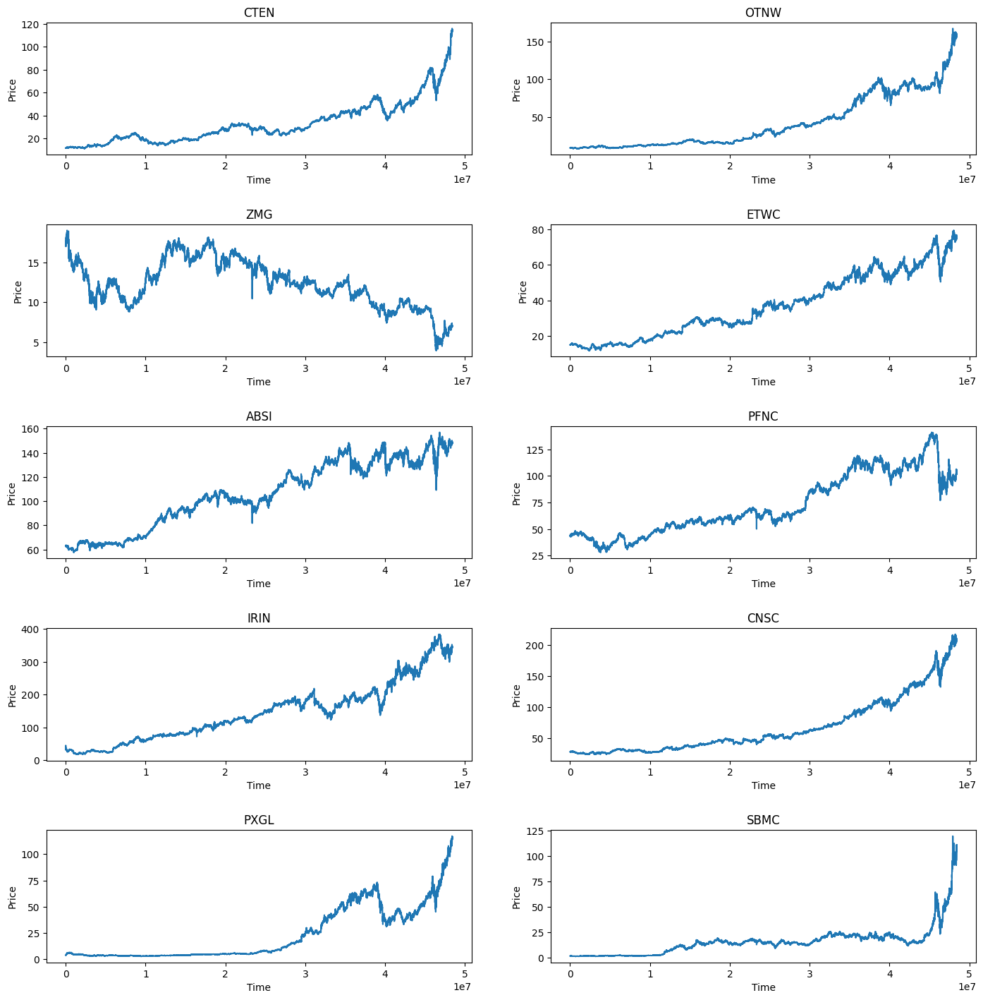

In [67]:
# Plotting Grid
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))
fig.tight_layout(pad=5.0)

tickers = historical_prices.columns
for i, ticker in enumerate(tickers):
    ax = axes[i//2, i%2]
    historical_prices[ticker].plot(ax=ax, title=ticker)
    ax.set_xlabel("Time")
    ax.set_ylabel("Price")

plt.show()

# OLS Regression Analysis: Exploring the Relationship between two assets.

In financial econometrics, understanding the relationship between two time series, especially their linear interdependence, can be pivotal. One of the primary tools for this purpose is the Ordinary Least Squares (OLS) regression. The OLS method minimizes the sum of the squared differences between the observed and estimated values.

Given two assets, we aim to determine if there exists a linear relationship between them. This relationship can be represented by:

$$ Y_t = \alpha + \beta x_t + \epsilon_t $$


Where:
* Y = Represents the price of Asset 1 at time t, now as the dependent variable.
* X = Represents the price of Asset 2 at time t, now as the independent variable.
* α is the intercept term.
* β is the slope coefficient, representing the change in Asset 1's price for a unit change in Asset 2's price.
* ϵ is the error term at time t, capturing all other factors affecting Asset 1's price that are not explained by Asset 2's price.

In [68]:
import statsmodels.api as sm

y = historical_prices["CTEN"] # Dependent variable.
X = historical_prices["CNSC"] # Independent variable.
X = sm.add_constant(X) # Independent variable with constant.

# Perform OLS regression
model = sm.OLS(y, X).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   CTEN   R-squared:                       0.943
Model:                            OLS   Adj. R-squared:                  0.943
Method:                 Least Squares   F-statistic:                 1.593e+05
Date:                Tue, 15 Oct 2024   Prob (F-statistic):               0.00
Time:                        17:20:17   Log-Likelihood:                -28029.
No. Observations:                9684   AIC:                         5.606e+04
Df Residuals:                    9682   BIC:                         5.608e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          6.1842      0.080     76.929      0.000       6.027       6.342
CNSC           0.3968      0.001    399.114      0.000       0.395       0.399
==============================================================================
Omnibus:                      760.846   Durbin-Watson:                   0.009
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2186.074
Skew:                           0.424   Prob(JB):                         0.00
Kurtosis:                       5.167   Cond. No.                         146.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Using the statsmodels library, we’ve performed an OLS regression to understand the linear relationship between the assets. The following are the key results:

1. **Intercept (Alpha)**:
* This value represents the expected value of Asset 1 when Asset 2 is zero. It’s the point where the regression line crosses the Y-axis.

2. **Slope (Beta)**:
* This coefficient represents the change in Asset 1 for a unit change in Asset 2.

3. **R-squared**:
* This metric provides the proportion of the variance in the dependent variable (Asset 1) that’s predictable from the independent variable (Asset 2). An R-squared of 0.333 suggests that approximately 33.3% of the variability in Asset 1 can be explained by Asset 2.

4. **Durbin-Watson**:
* This test statistic tests for the presence of autocorrelation in the residuals. A value close to 2 suggests no autocorrelation, while a value that is far from 2, indicating possible autocorrelation.

5. **Condition Number**:
* A high value suggests potential multicollinearity issues or other numerical problems.

### Implement OLS Regression for the other pairs.

In the section below you can use the ```sm.OLS(y, X).fit()``` to check for the other assets being used in this challenge.

In [69]:
# your code himport statsmodels.api as sm
names = historical_prices.columns.tolist()

for n1 in names:
    for n2 in names:
        if n1 != n2:  # Skip when both tickers are the same
            y = historical_prices[n1]  # Dependent variable
            X = historical_prices[n2]  # Independent variable
            
            # Add constant to the independent variable
            X = sm.add_constant(X)
            
            # Perform OLS regression
            model = sm.OLS(y, X).fit()
            print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                   CTEN   R-squared:                       0.892
Model:                            OLS   Adj. R-squared:                  0.892
Method:                 Least Squares   F-statistic:                 8.009e+04
Date:                Tue, 15 Oct 2024   Prob (F-statistic):               0.00
Time:                        17:20:17   Log-Likelihood:                -31091.
No. Observations:                9684   AIC:                         6.219e+04
Df Residuals:                    9682   BIC:                         6.220e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         12.1840      0.095    127.824      0.0

<img src="https://algo-assets.amplifyme.com/quant/gresearch/GResearch_Cointegration_C2.png" width="100%"/>

## Spread and Its Significance in Pairs Trading

In pairs trading, the spread is a pivotal concept. It quantifies the deviation of the relationship between two assets from their historical mean. When the spread substantially diverges from this mean, trading opportunities might emerge.


The spread is calculated as:

$$
\text{Spread} = X - (\alpha + \beta \times Y)
$$

Here: 
* X = Asset 1
* Y = Asset 2
* α represents the intercept from our OLS regression. 
* β denotes the slope or hedge ratio from our OLS regression.


The spread, in essence, captures the residuals of our regression model. It signifies the difference between the actual price of Asset 1 and its predicted value based on the price of Asset 2.

## Visualising Residuals for Spread Trading

It’s essential to compute the residuals to be used for trading. These residuals represent the deviations between the observed price of Asset 1 and its predicted value based with the Asset 2 prices.

Residuals are an integral part of pairs trading. They encapsulate the temporary mispricings or deviations from the established relationship between the two assets, which are the trading opportunities we aim to exploit.

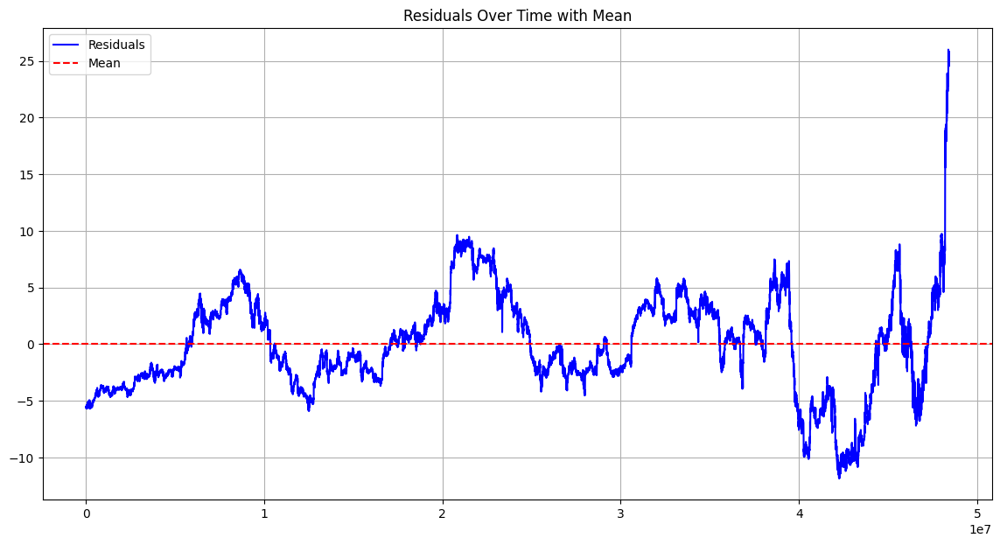

In [70]:
# Calculate residuals
X_const = sm.add_constant(historical_prices["CNSC"])
model = sm.OLS(historical_prices["CTEN"], X_const).fit()
residuals = model.resid

plt.figure(figsize=(14,7))
plt.plot(residuals, label='Residuals', color='blue')
plt.axhline(residuals.mean(), color='red', linestyle='--', label='Mean')
plt.title('Residuals Over Time with Mean')
plt.legend()
plt.grid(True)
plt.show()

### Implement Residuals for the other pairs.

In the section below you can use the code above to check for the other assets being used in this challenge.

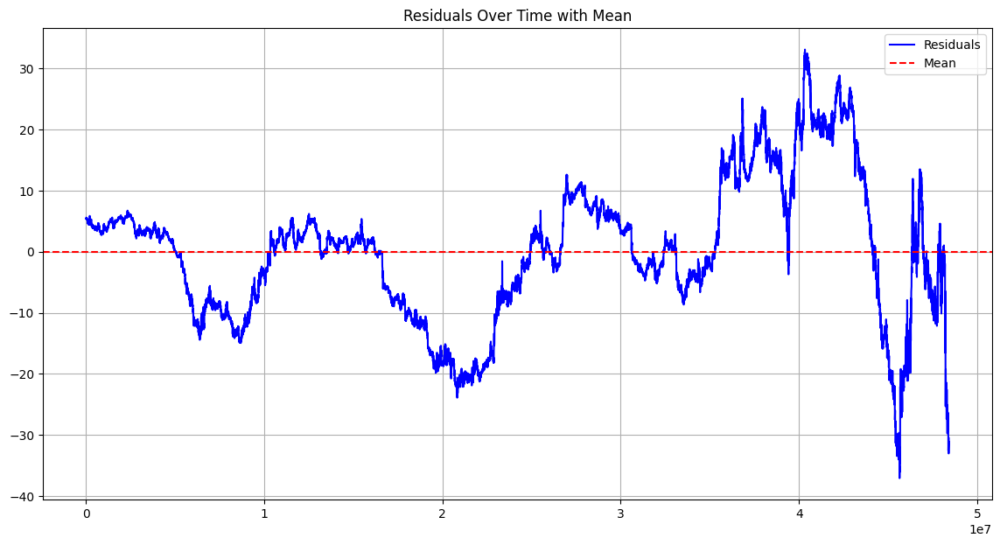

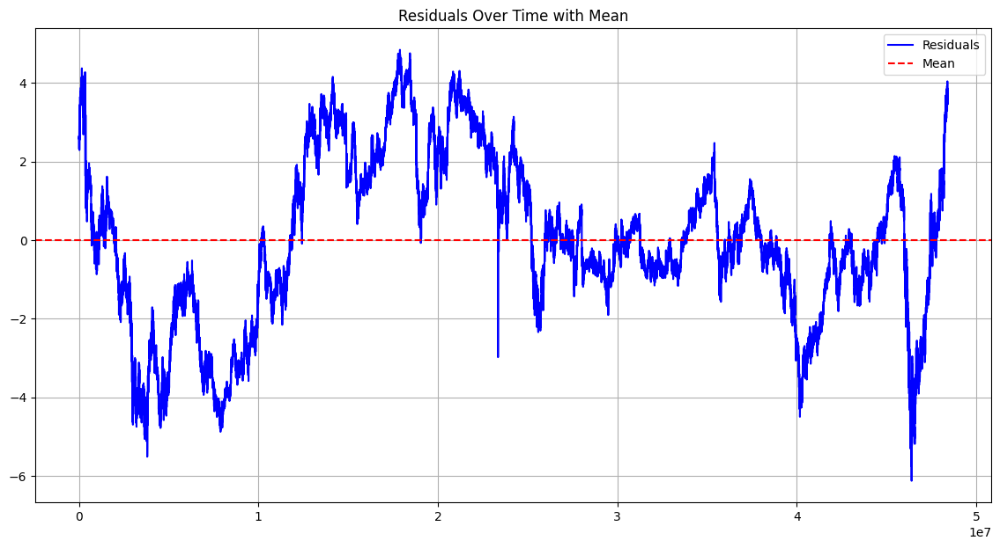

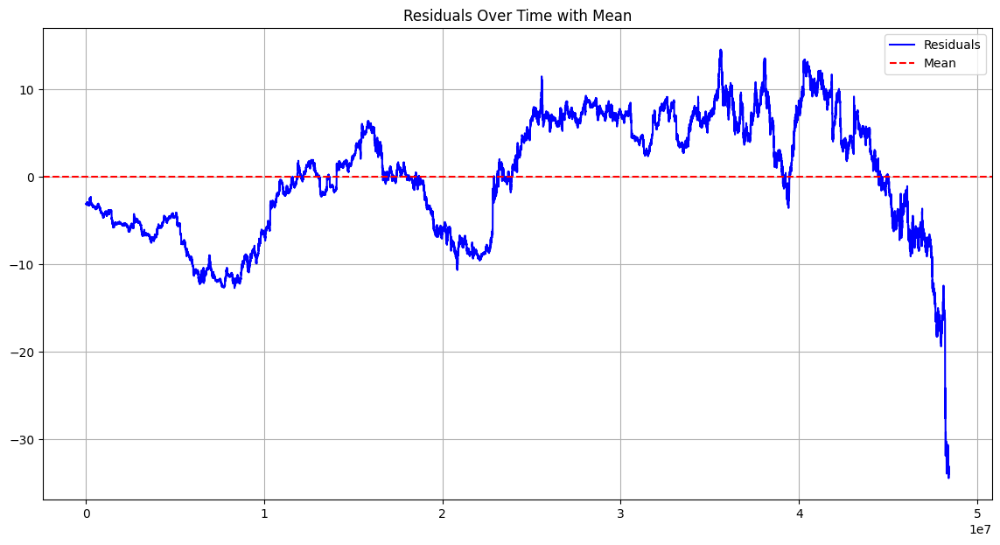

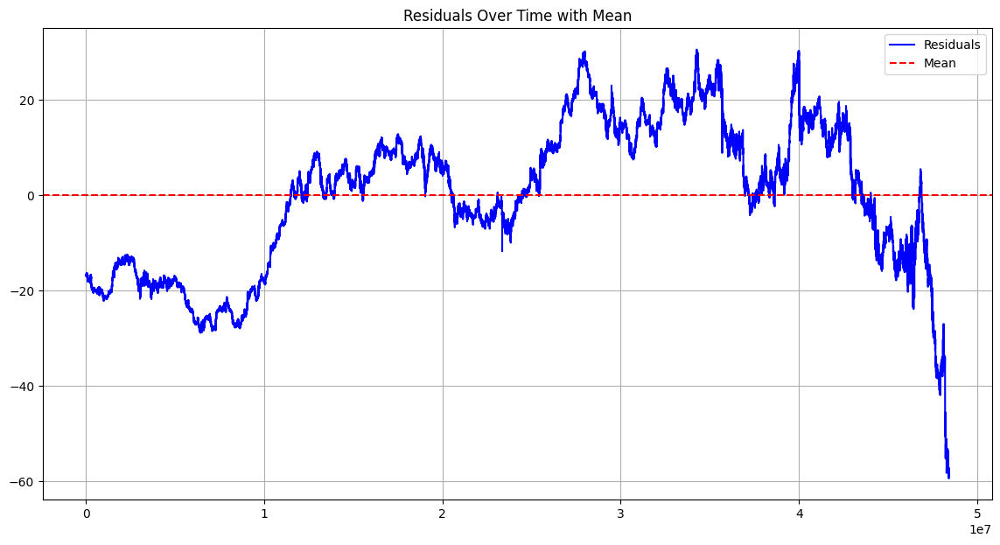

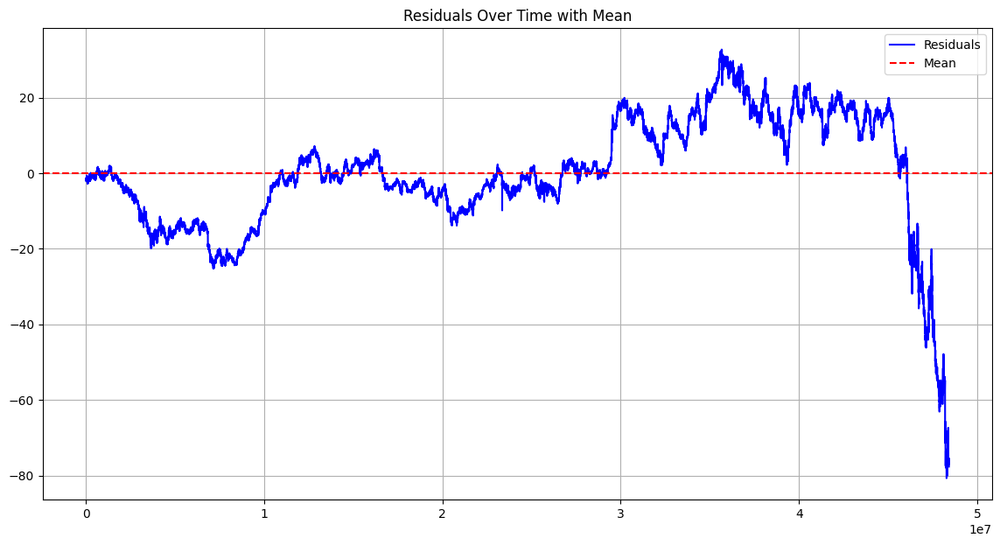

...

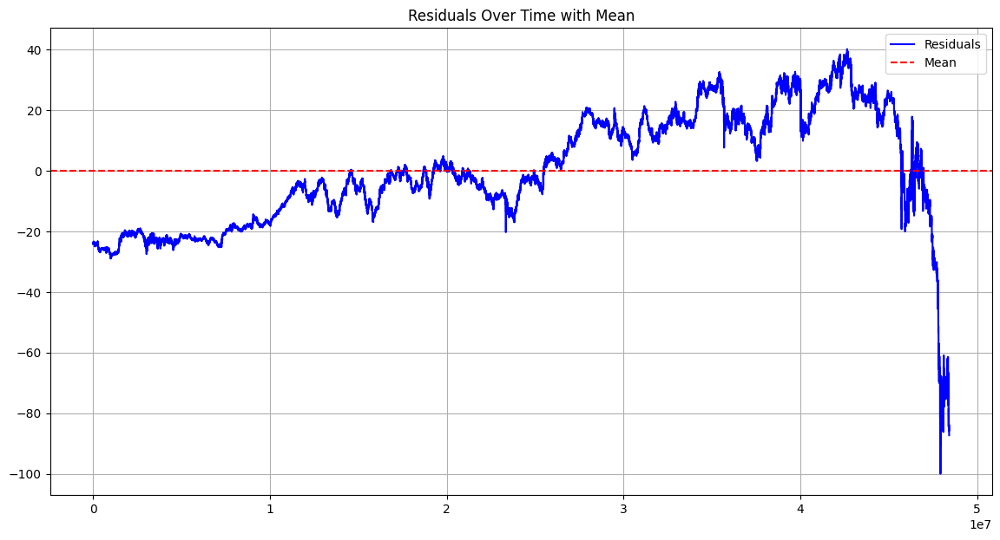

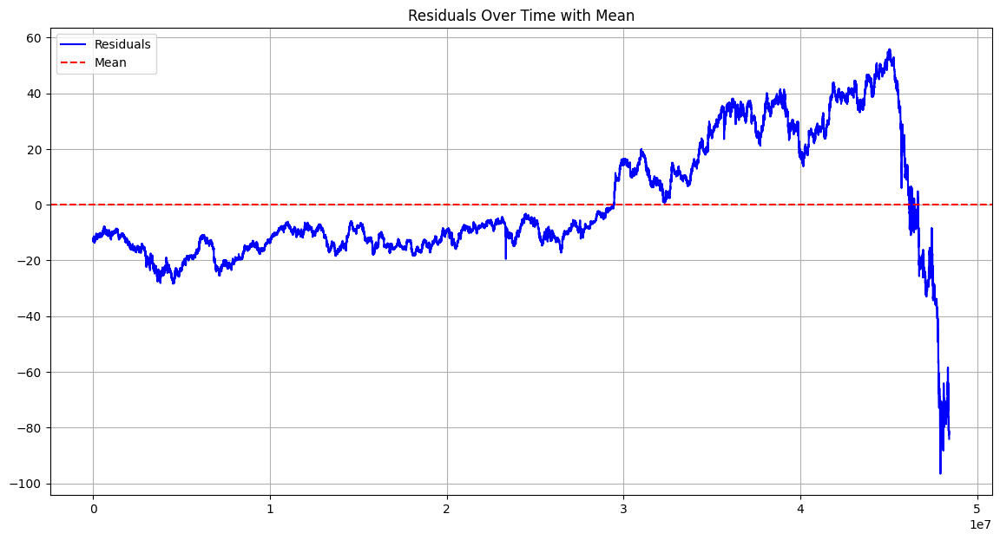

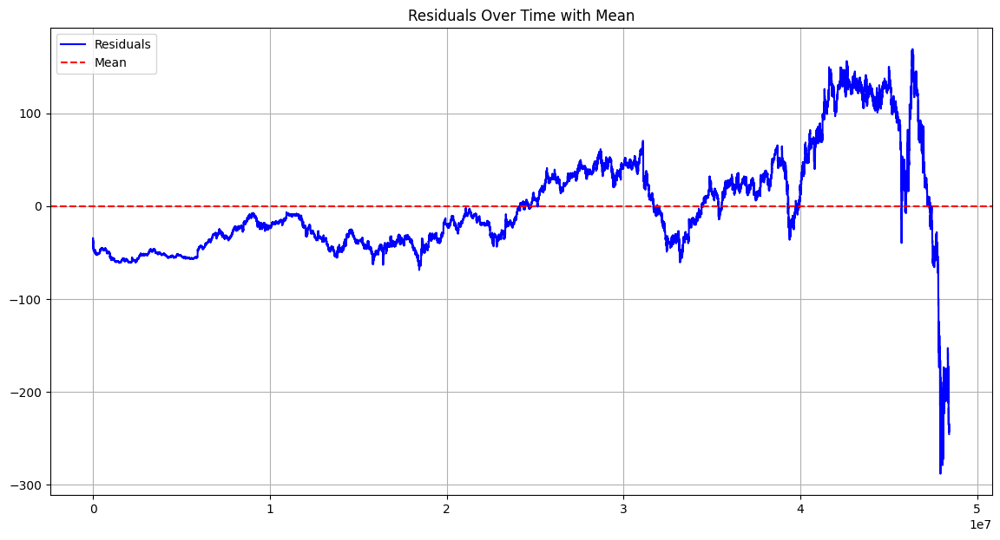

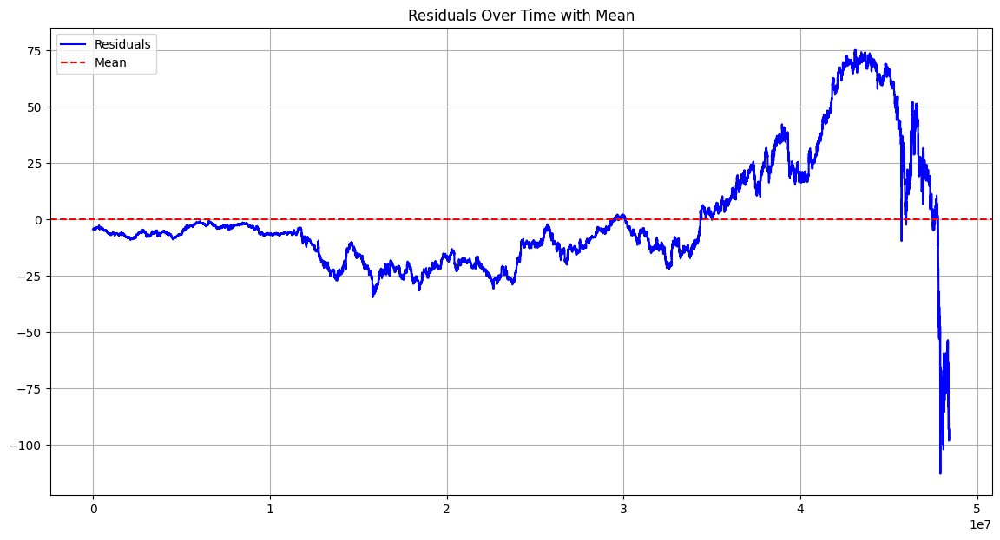

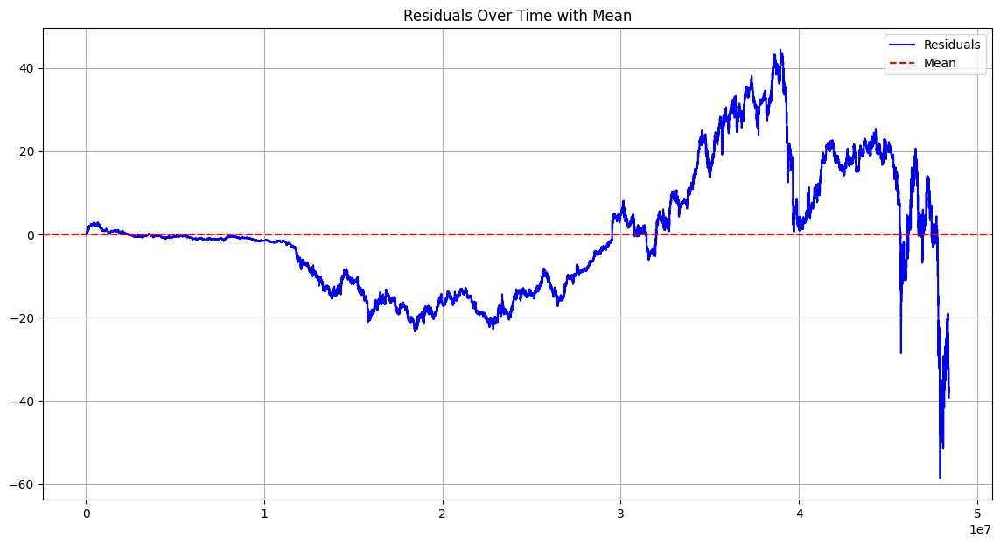

In [71]:
# your code here

# your code himport statsmodels.api as sm
names = ['CTEN', 'OTNW', 'ZMG', 'ETWC', 'ABSI', 'PFNC', 'IRIN', 'CNSC', 'PXGL',
       'SBMC']

resid_dict = {}
for n1 in names:
    for n2 in names:
        if n1 != n2:  # Skip when both tickers are the same
            # Calculate residuals
            X_const = sm.add_constant(historical_prices[n1])
            model = sm.OLS(historical_prices[n2], X_const).fit()
            residuals=model.resid
            resid_dict[n1, n2] = residuals

            plt.figure(figsize=(14,7))
            plt.plot(residuals, label='Residuals', color='blue')
            plt.axhline(residuals.mean(), color='red', linestyle='--', label='Mean')
            plt.title('Residuals Over Time with Mean')
            plt.legend()
            plt.grid(True)
            plt.show()

The plotted residuals show how the spread fluctuates over time. In a perfect scenario, if our model captured all dynamics, the residuals would cluster tightly around zero. However, in real-world financial data, various factors lead to deviations. Our goal in pairs trading is to capitalize on these deviations when they are extreme and bet on their eventual convergence back to the mean.

## Augmented Dickey-Fuller Test

The Augmented Dickey-Fuller (ADF) test is a prominent unit root test used to diagnose the stationarity of a given time series. A time series is deemed stationary if its statistical attributes (such as mean and variance) do not alter over time. For our pairs trading strategy, ascertaining stationarity is pivotal, as it ensures that the spread between the pairs is mean-reverting, allowing for potential arbitrage opportunities.

#### Implementation Steps:
1. **OLS Regression**:
* An Ordinary Least Squares (OLS) regression was conducted where the first difference of the series was regressed against its value and any differences. The purpose is to capture the relationship between the changes in the series and its past values.

2. **Test Statistic Calculation**:
* The ADF test statistic was derived as the quotient of the coefficient of the level of the series and its standard error. This statistic gauges the significance of the level in explaining the changes in the series.

3. **Comparison with Critical Values**:
* To make an inference regarding stationarity, the computed test statistic is contrasted against predefined critical values. If the statistic is less than the critical value (often at 1%, 5%, or 10% significance levels), the null hypothesis of a unit root (implying non-stationarity) is rejected, signaling that the series is stationary.

In [72]:
def adf_test(y):
    y = pd.Series(y)

    # Using statsmodels to get the results
    adf_result = adfuller(y, maxlag=0)
    pvalue = adf_result[1]
    critical_values = adf_result[4]
    
    print(f"ADF Statistic (statsmodels): {adf_result[0]}")
    print(f"p-value: {pvalue:.10f}")
    for key, value in critical_values.items():
        print(f"Critical Value ({key}): {value}")

adf_test(residuals)

ADF Statistic (statsmodels): -3.4208021453201964
p-value: 0.0102698416
Critical Value (1%): -3.431025517339754
Critical Value (5%): -2.8618385374045467
Critical Value (10%): -2.5669289063406016


### Implement ADF Test for the other pairs.

In the section below you can use the ```adf_test(y)``` above to check for the other assets being used in this challenge.

In [73]:
# your code here
names = historical_prices.columns.tolist()

for n1 in names:
    for n2 in names:
        if n1 != n2:
            y = resid_dict[n1,n2]
            print(n1,n2)
            adf_test(y)

    

CTEN OTNW
ADF Statistic (statsmodels): -3.53013469879176
p-value: 0.0072460709
Critical Value (1%): -3.431025517339754
Critical Value (5%): -2.8618385374045467
Critical Value (10%): -2.5669289063406016
CTEN ZMG
ADF Statistic (statsmodels): -6.729754531169522
p-value: 0.0000000033
Critical Value (1%): -3.431025517339754
Critical Value (5%): -2.8618385374045467
Critical Value (10%): -2.5669289063406016
CTEN ETWC
ADF Statistic (statsmodels): -1.5409032903381583
p-value: 0.5131888437
Critical Value (1%): -3.431025517339754
Critical Value (5%): -2.8618385374045467
Critical Value (10%): -2.5669289063406016
CTEN ABSI
ADF Statistic (statsmodels): -2.756151415026915
p-value: 0.0648153351
Critical Value (1%): -3.431025517339754
Critical Value (5%): -2.8618385374045467
Critical Value (10%): -2.5669289063406016
CTEN PFNC
ADF Statistic (statsmodels): -1.4652453437582196
p-value: 0.5506286080
Critical Value (1%): -3.431025517339754
Critical Value (5%): -2.8618385374045467
Critical Value (10%): -2.56

<img src="https://algo-assets.amplifyme.com/quant/gresearch/GResearch_Cointegration_C3.png" width="100%"/>

## Trading Bounds Analysis

Pairs trading is predicated on the belief that if two co-integrated securities drift apart in terms of price, they will eventually revert back to a mean. The strategy thus revolves around identifying deviations from this mean and capitalizing on the expected mean reversion.

1. **Long Signal**:

This arises when the spread (or the residuals) dips below a predetermined lower threshold. A low spread indicates that, relative to its counterpart, the primary asset (as per our regression) is undervalued. In response, we should:

* Long the primary asset (believing its price will rise).
* Short the secondary asset (anticipating a price drop).

$$
\text{Spread}_t < \text{Lower Bound} \Rightarrow \text{Long Asset 1, Short Asset 2}
$$

2. **Short Signal**:

This is activated when the spread exceeds a predetermined upper threshold. A high spread signifies that the primary asset is overpriced relative to the secondary asset. Consequently, we should:

* Short the primary asset (anticipating its price will fall).
* Long the secondary asset (believing its price will ascend).

$$
\text{Spread}_t > \text{Upper Bound} \Rightarrow \text{Short Asset 1, Long Asset 2}
$$


3. **Exit Signal (Neutralize):**

This signal prompts us to close out any positions and return to a neutral stance. It’s initiated when the spread converges back towards its mean, hinting at the assets reverting to their equilibrium relationship. This is our cue to capitalize on the positions we’ve taken based on the long/short signals and secure our gains.

$$ 
\text{Lower Bound} \leq \text{Spread}_t \leq \text{Upper Bound} \Rightarrow \text{Exit Positions}
$$



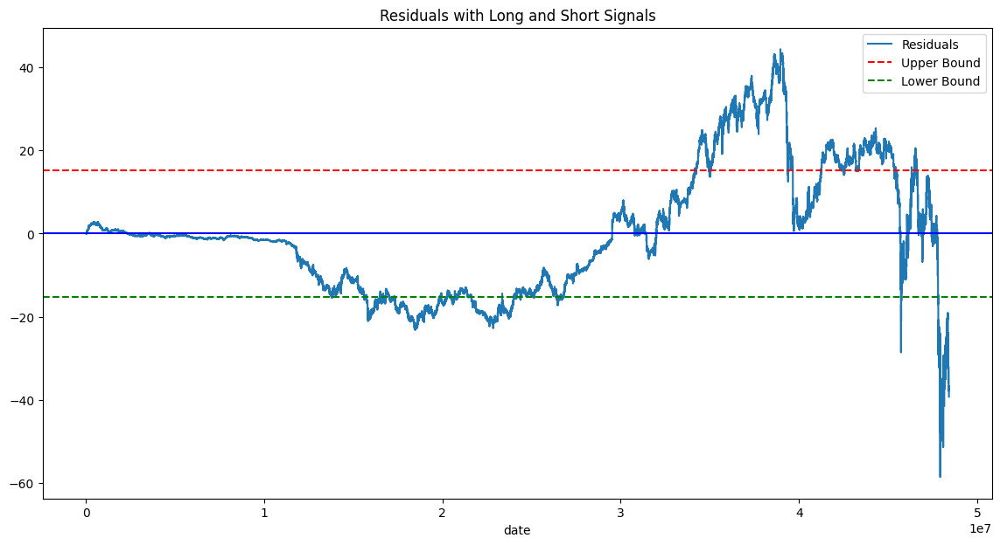

In [74]:
def generate_signals(residuals, Z, price_data_index, show_graph=True): # Generate bounds
    mu_e = residuals.mean()
    sigma_eq = residuals.std()
    upper_bound = mu_e + Z * sigma_eq
    lower_bound = mu_e - Z * sigma_eq
    if not isinstance(residuals, pd.Series):
        residuals_series = pd.Series(residuals, index=price_data_index)
    else:
        residuals_series = residuals
    
    # Generate signals
    signals = pd.Series(index=residuals_series.index, dtype='float64') 
    signals[residuals_series > upper_bound] = -1 # Short signal signals[residuals_series < lower_bound] = 1 # Long signal
    signals = signals.fillna(0) # Fill NaN values with 0
    if show_graph:
        plt.figure(figsize=(14,7))
        residuals_series.plot(label='Residuals')
        plt.axhline(upper_bound, color='red', linestyle='--', label='Upper Bound')
    plt.axhline(lower_bound, color='green', linestyle='--', label='Lower Bound')
    plt.axhline(0, color='blue', linestyle='-') 
    plt.title('Residuals with Long and Short Signals') 
    plt.legend()
    plt.show()
    return upper_bound, lower_bound, residuals_series

upper_bound, lower_bound, residuals_series = generate_signals(residuals, 1, historical_prices.index[1:-1])

### Implement Trading Bounds Analysis for the other pairs.

In the section below you can use the ```generate_signals(residuals, Z, price_data_index, show_graph=True)``` above to check for the other assets being used in this challenge.

In [77]:
# Our redefinition to include names in title
def generate_signals(residuals, Z, price_data_index, n1, n2, show_graph=True): # Generate bounds
    mu_e = residuals.mean()
    sigma_eq = residuals.std()
    upper_bound = mu_e + Z * sigma_eq
    lower_bound = mu_e - Z * sigma_eq
    if not isinstance(residuals, pd.Series):
        residuals_series = pd.Series(residuals, index=price_data_index)
    else:
        residuals_series = residuals
    
    # Generate signals
    signals = pd.Series(index=residuals_series.index, dtype='float64') 
    signals[residuals_series > upper_bound] = -1 # Short signal signals[residuals_series < lower_bound] = 1 # Long signal
    signals = signals.fillna(0) # Fill NaN values with 0
    if show_graph:
        plt.figure(figsize=(14,7))
        residuals_series.plot(label='Residuals')
        plt.axhline(upper_bound, color='red', linestyle='--', label='Upper Bound')
    plt.axhline(lower_bound, color='green', linestyle='--', label='Lower Bound')
    plt.axhline(0, color='blue', linestyle='-') 
    plt.title(f'Residuals with Long and Short Signals {n1}, {n2}') 
    plt.legend()
    plt.show()
    return upper_bound, lower_bound, residuals_series

CTEN
CTEN OTNW


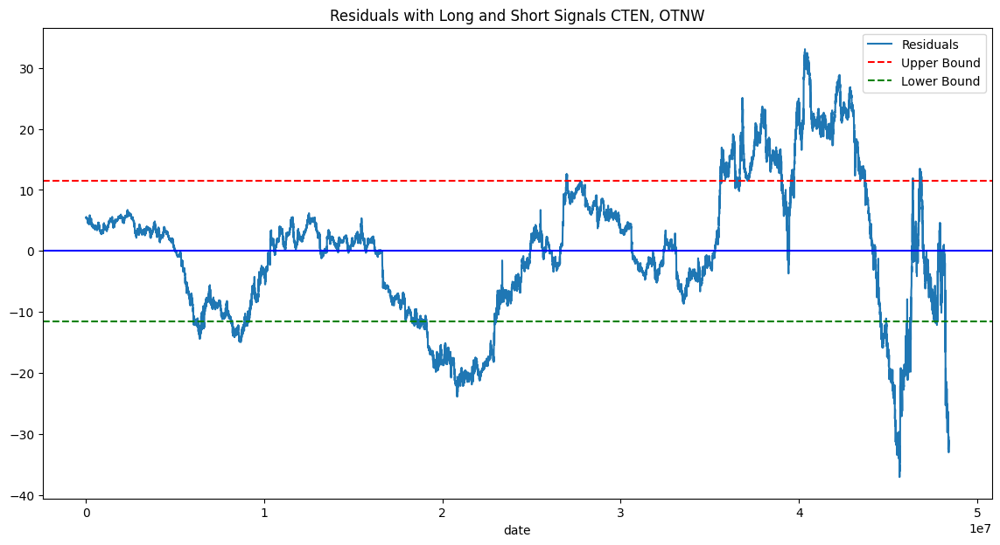

CTEN ZMG


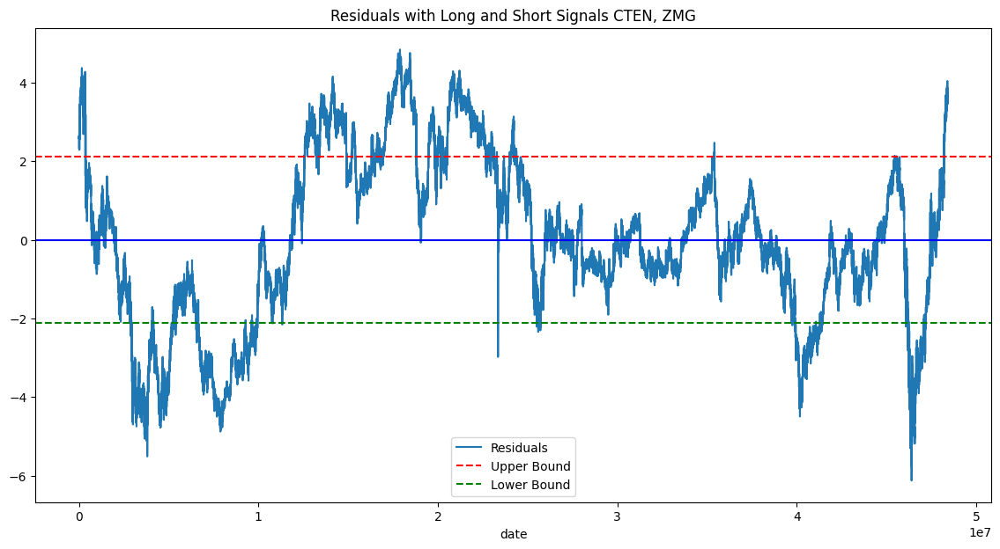

CTEN ETWC


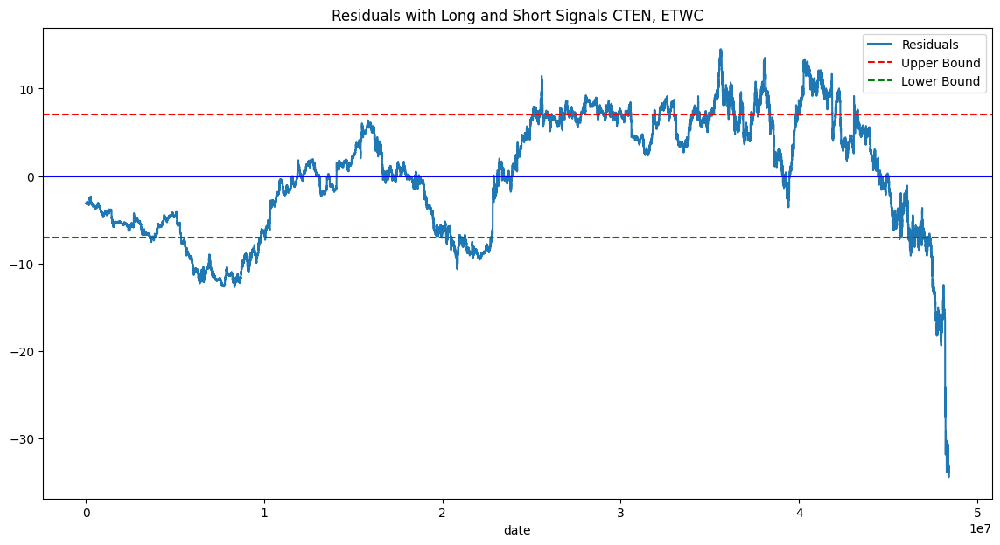

CTEN ABSI


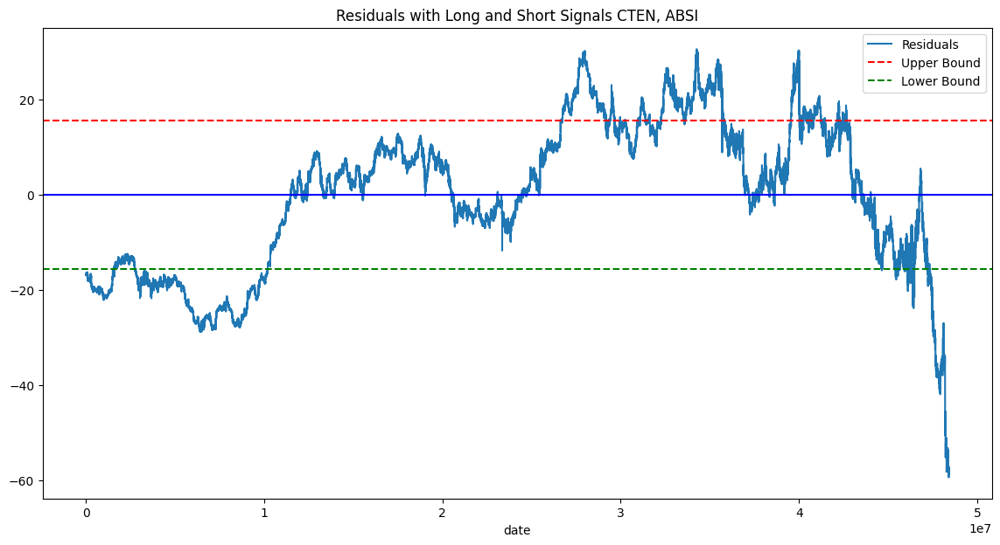

CTEN PFNC


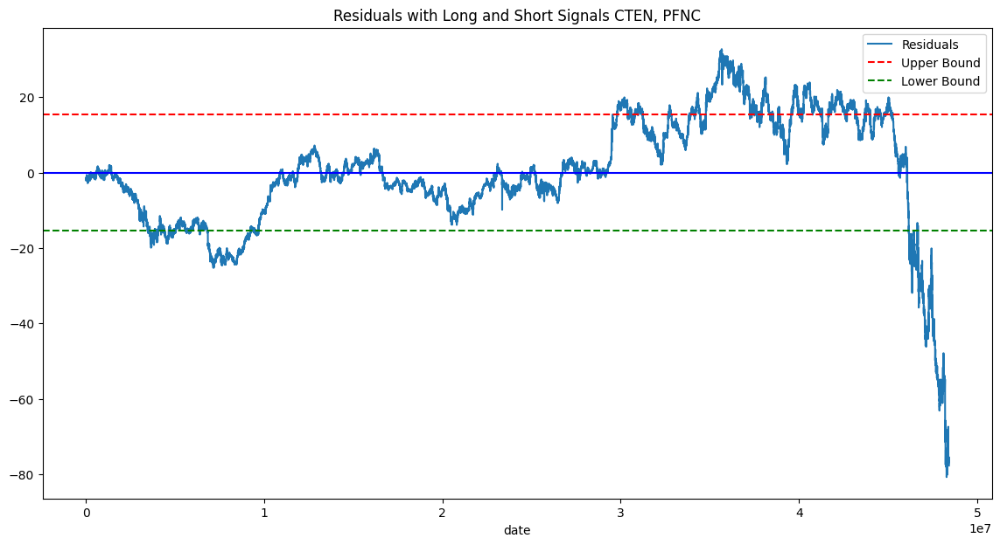

CTEN IRIN


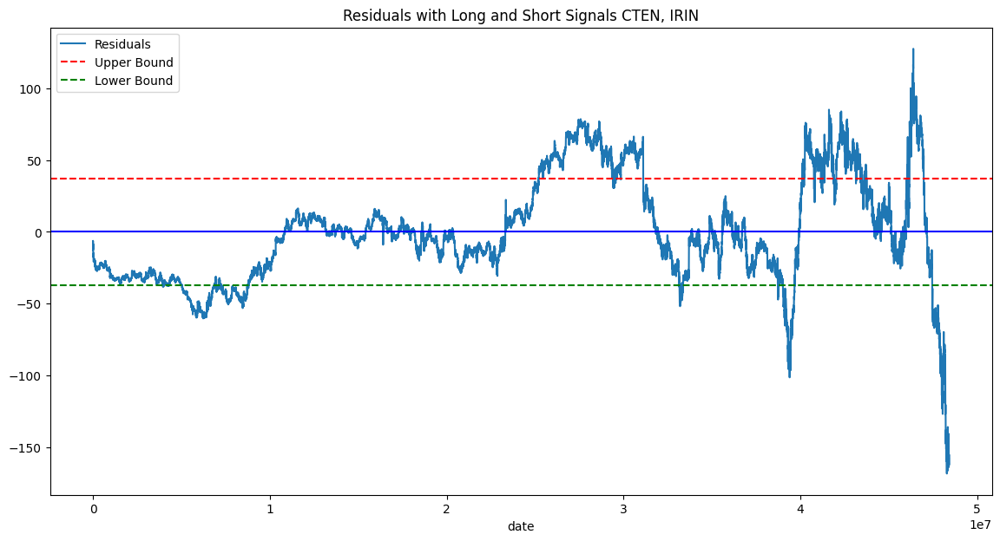

CTEN CNSC


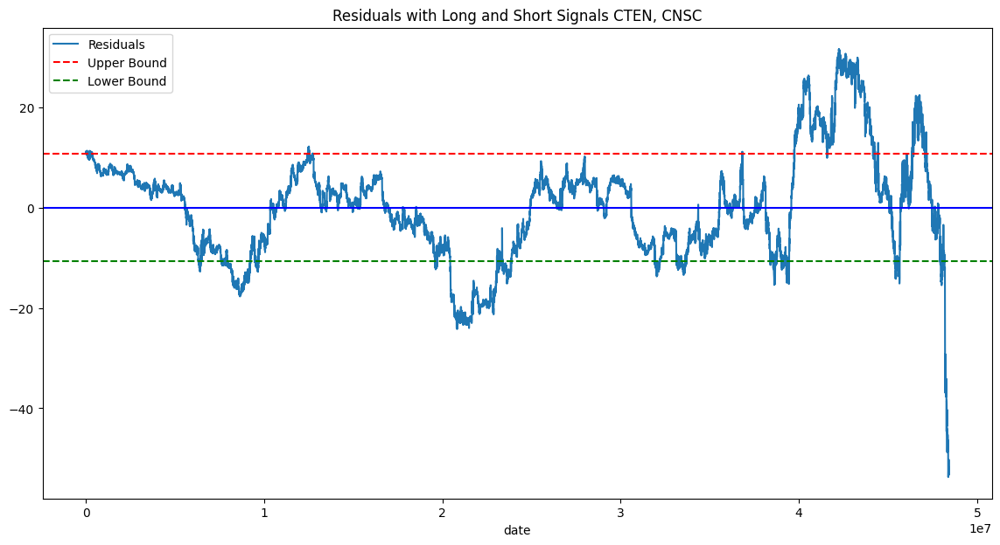

CTEN PXGL


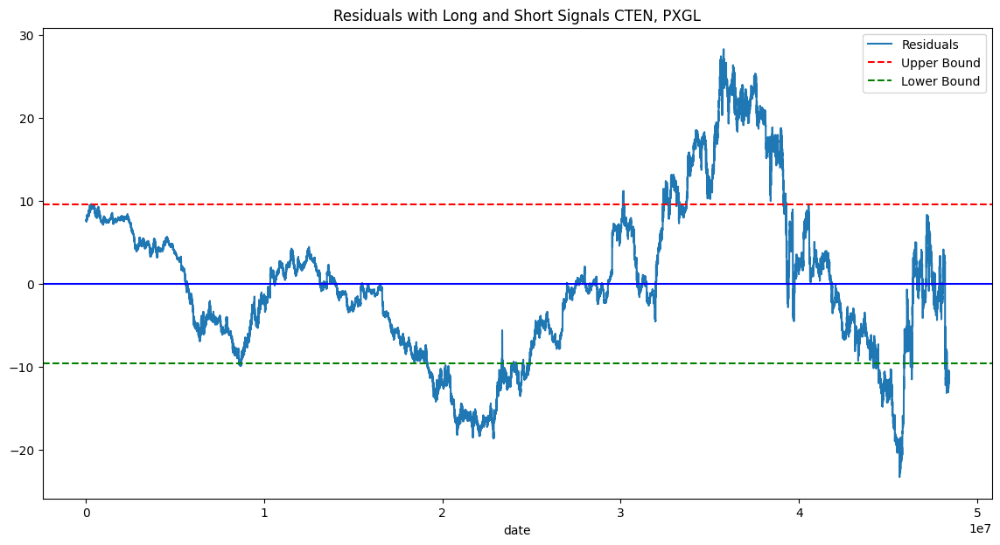

CTEN SBMC


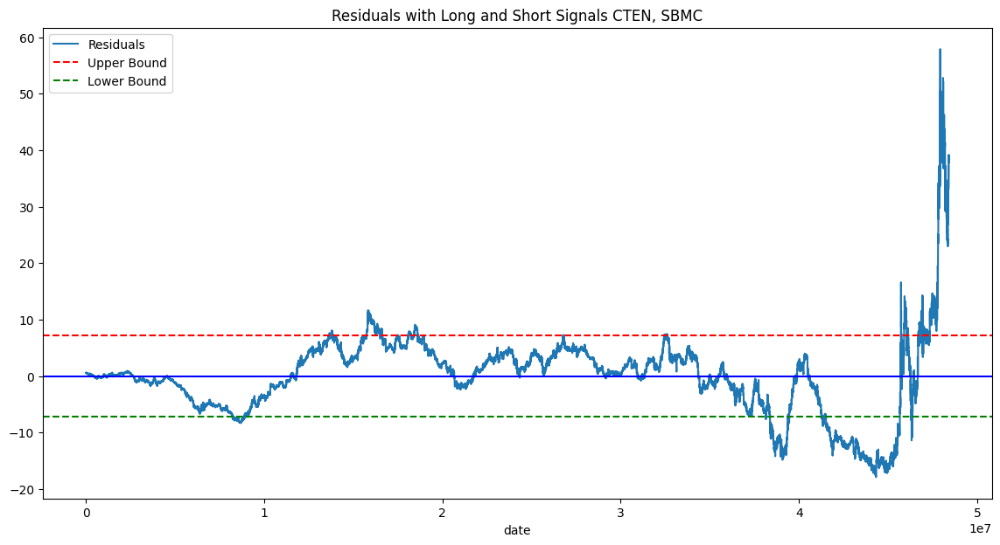

OTNW
OTNW CTEN


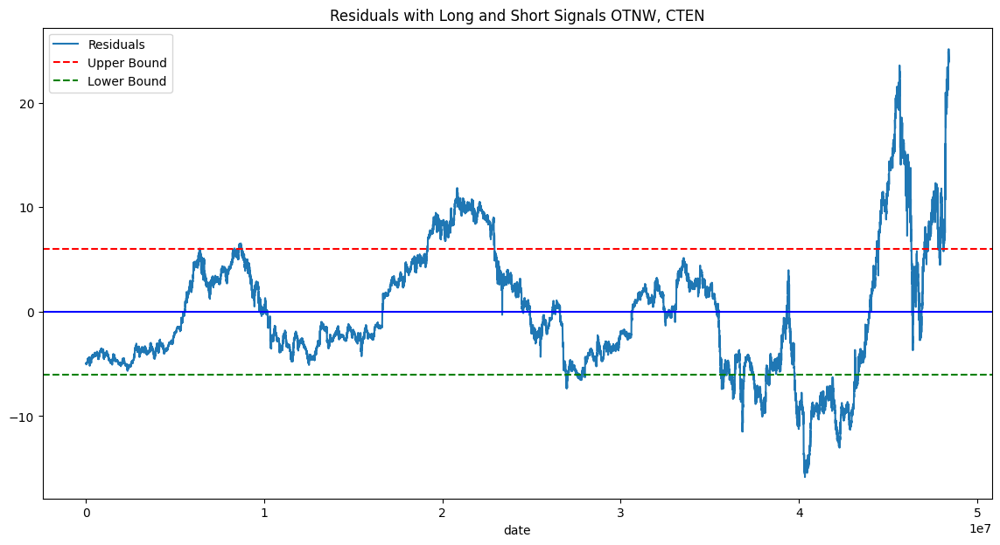

OTNW ZMG


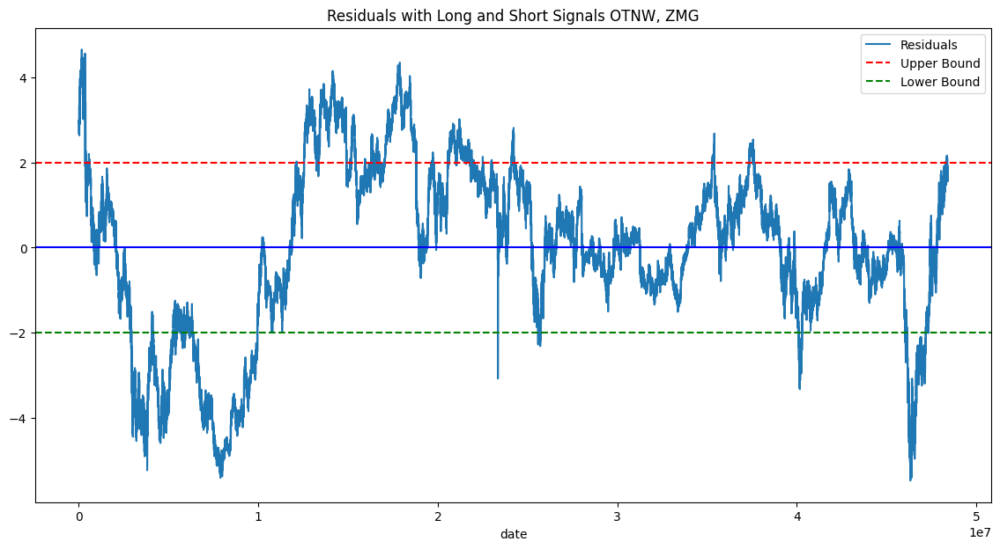

OTNW ETWC


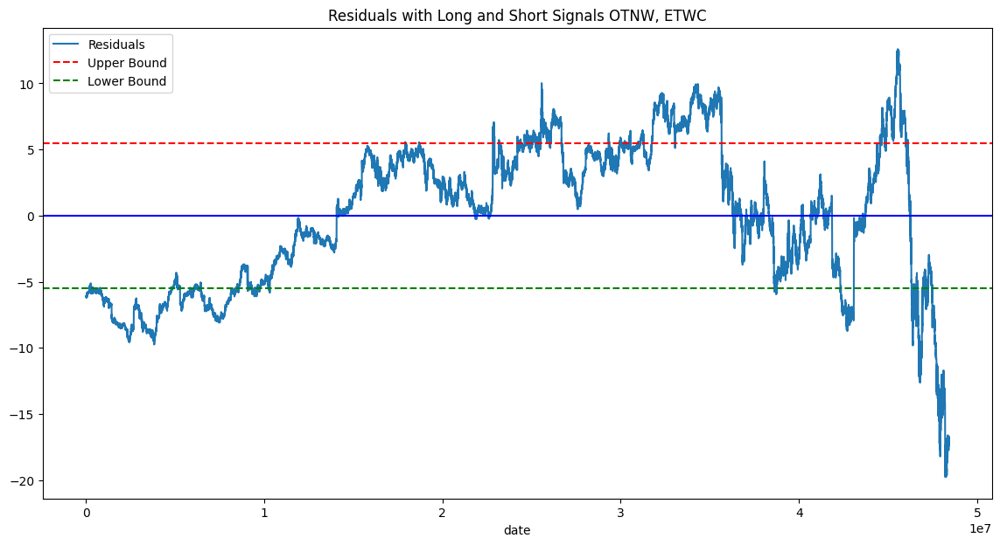

OTNW ABSI


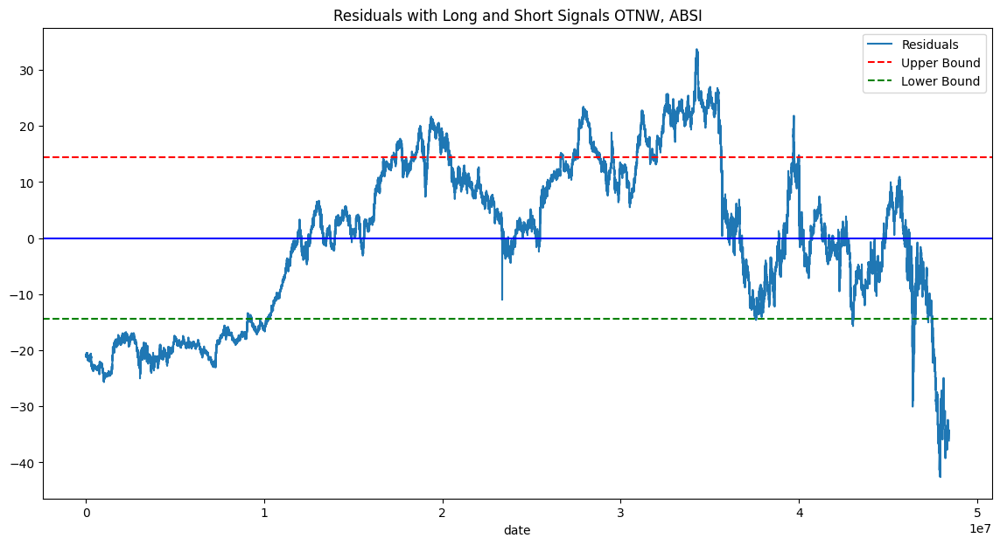

OTNW PFNC


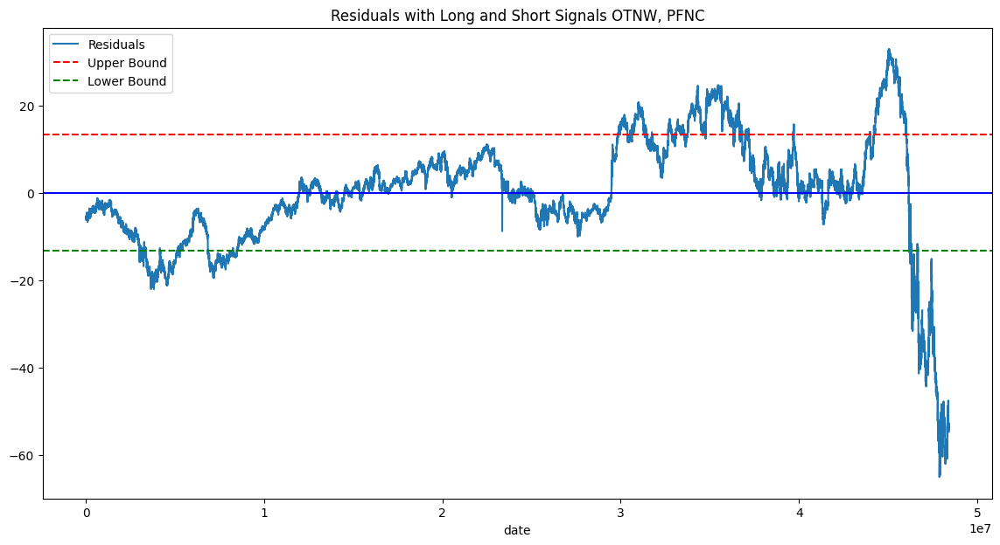

OTNW IRIN


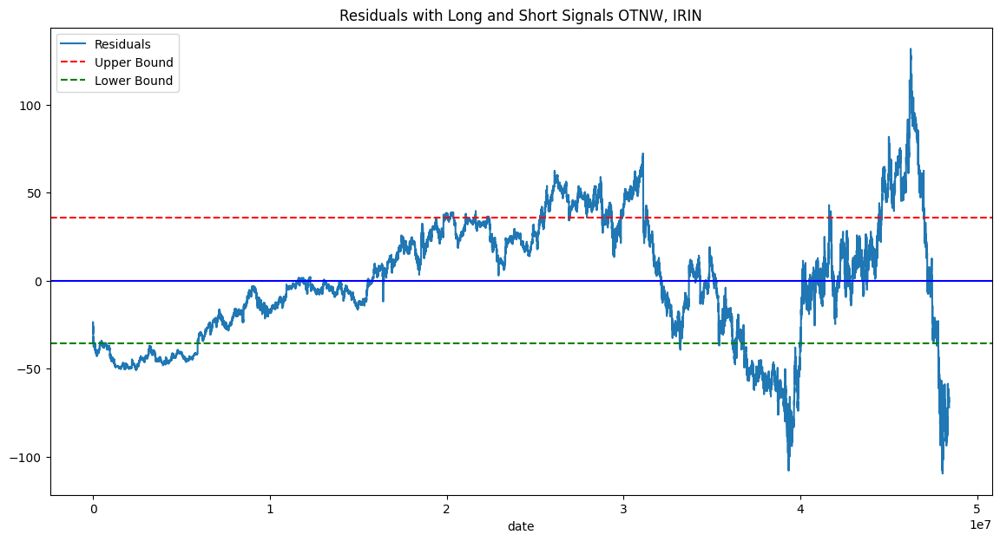

OTNW CNSC


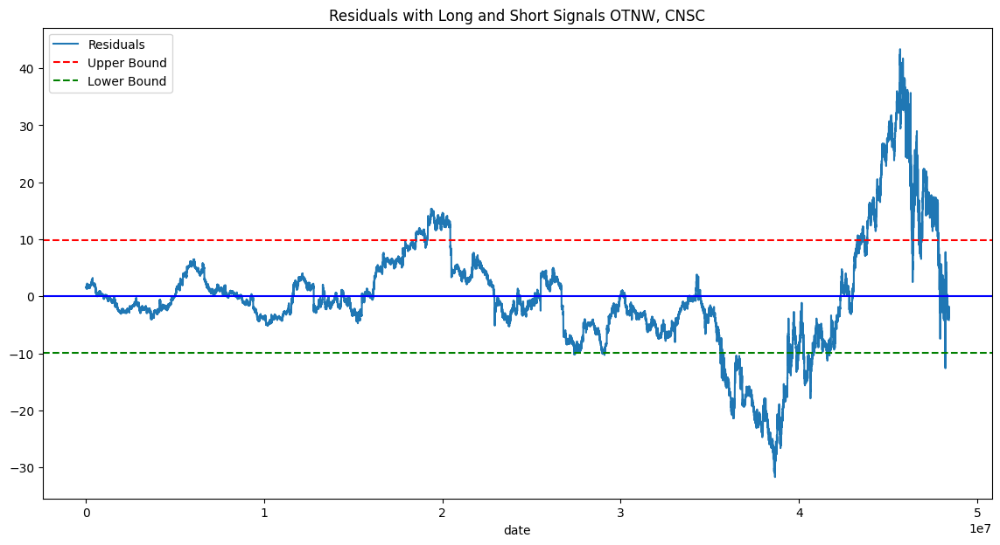

OTNW PXGL


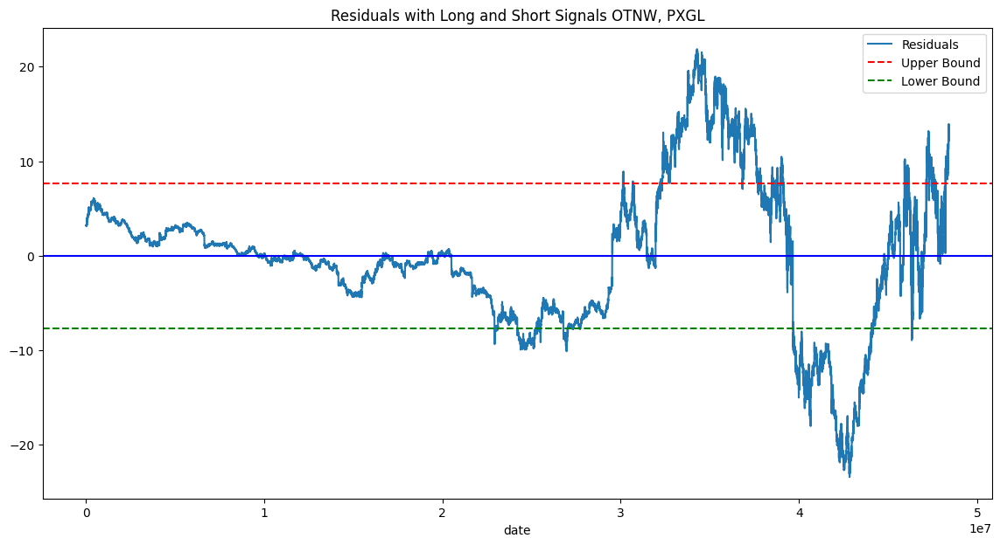

OTNW SBMC


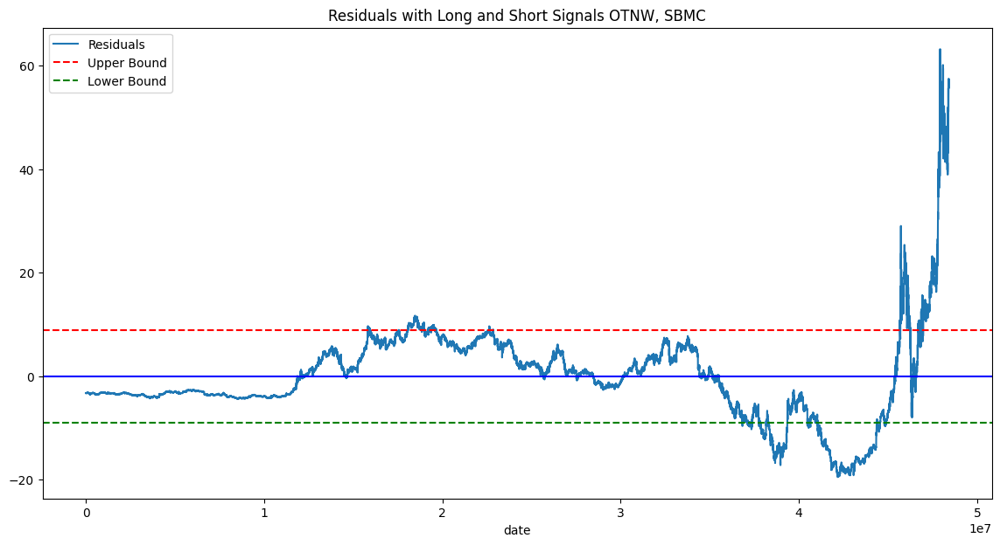

ZMG
ZMG CTEN


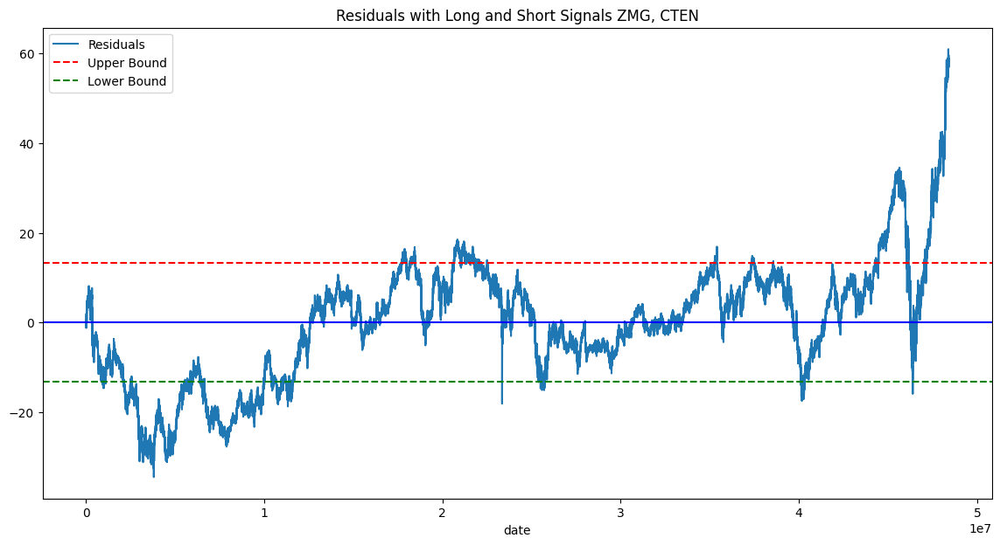

ZMG OTNW


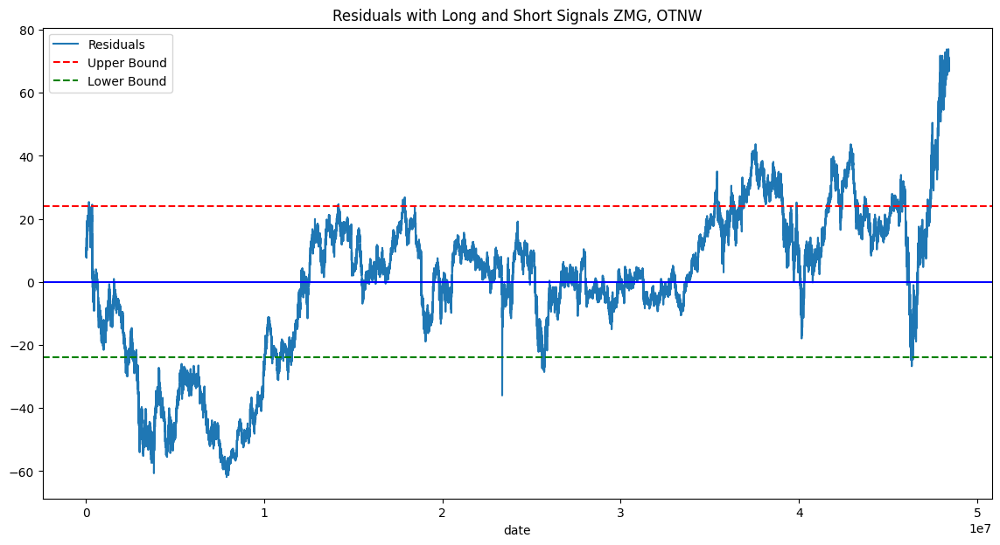

ZMG ETWC


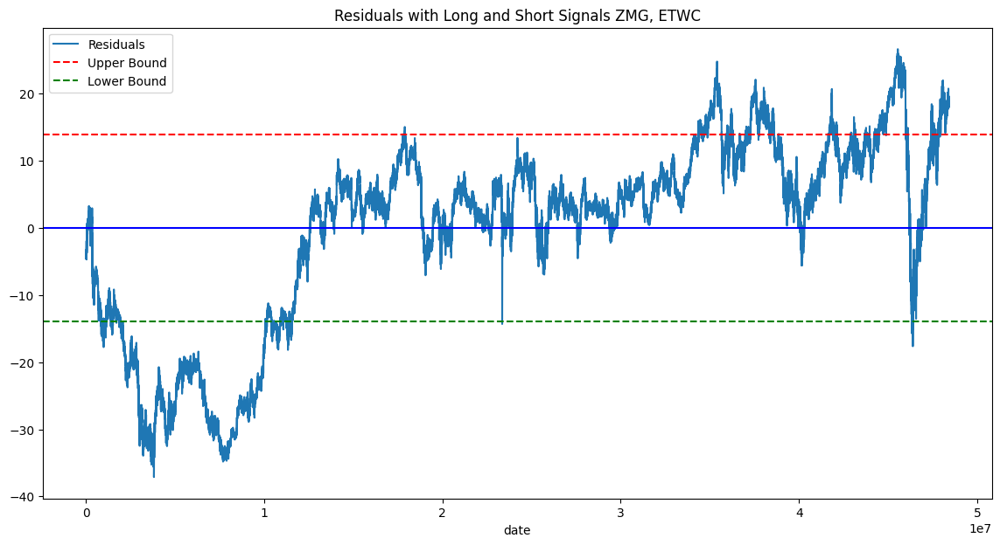

ZMG ABSI


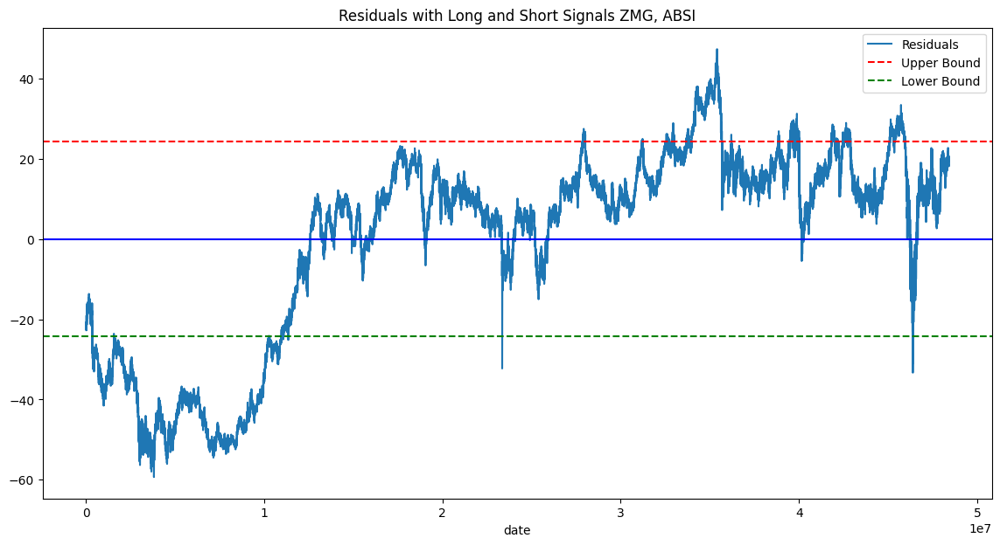

ZMG PFNC


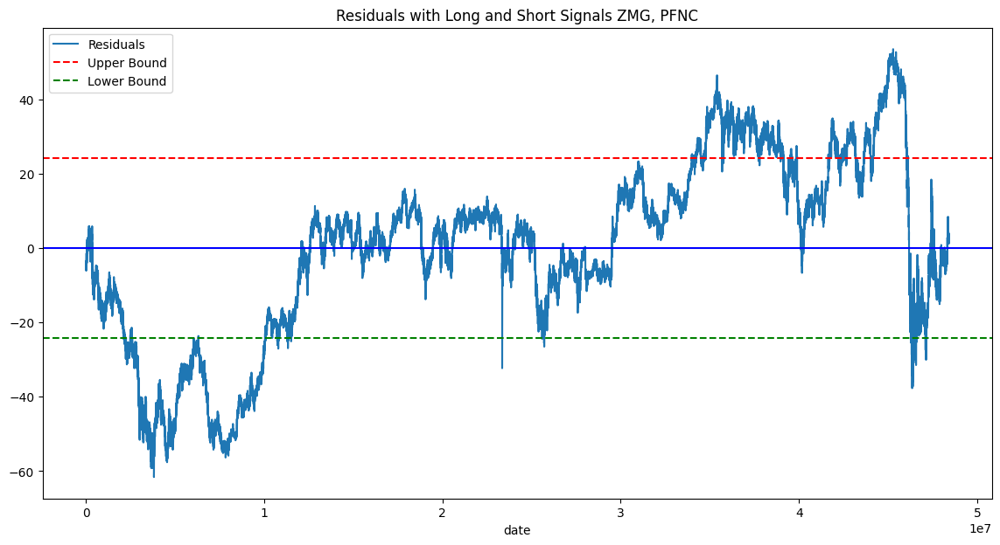

ZMG IRIN


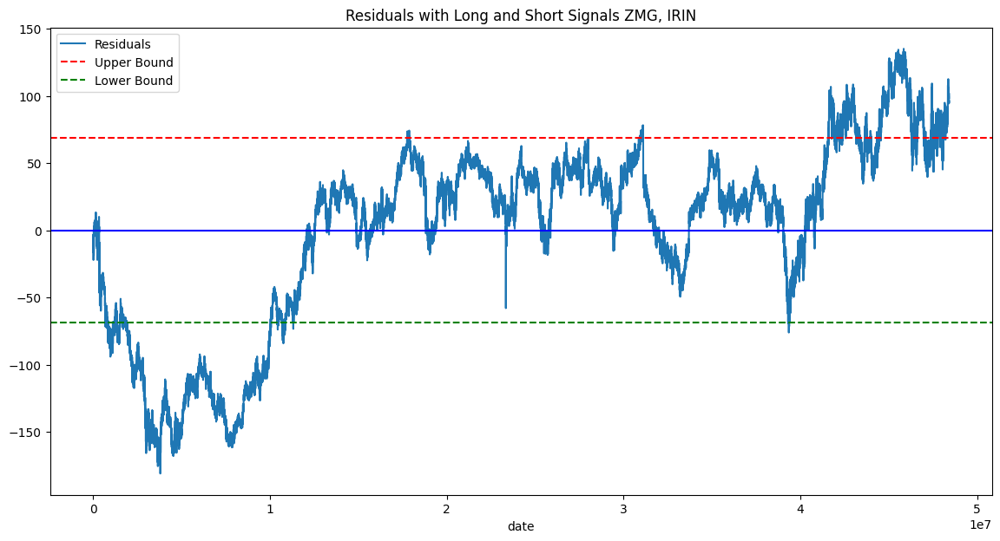

ZMG CNSC


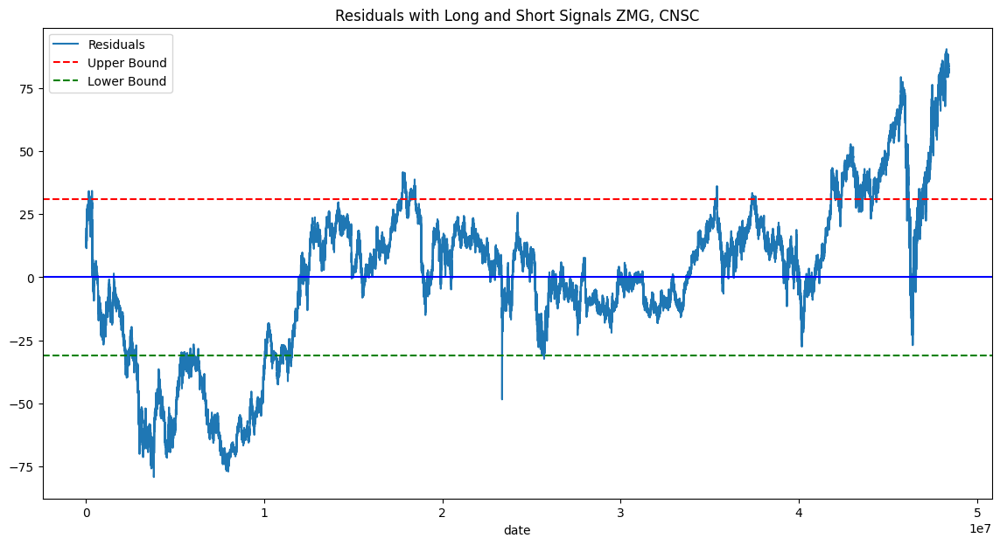

ZMG PXGL


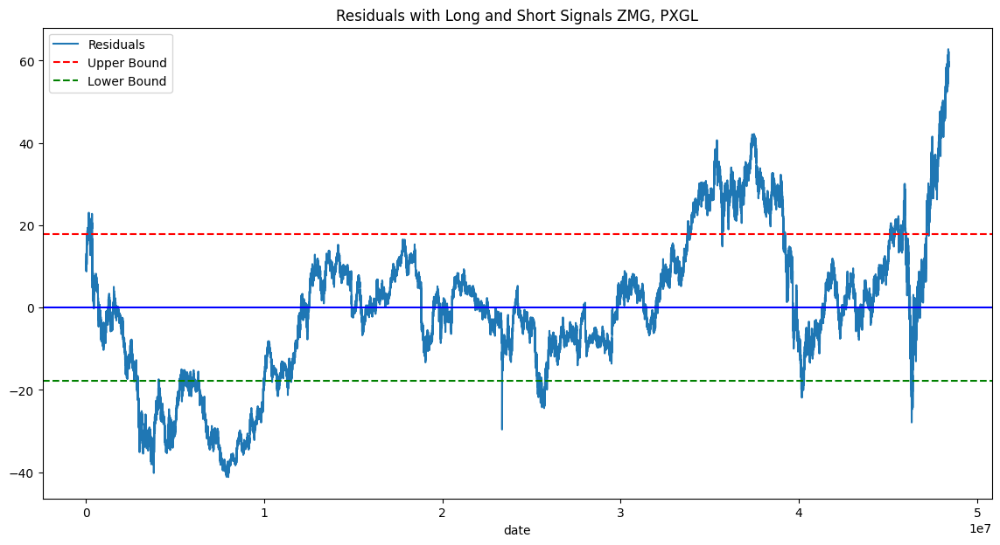

ZMG SBMC


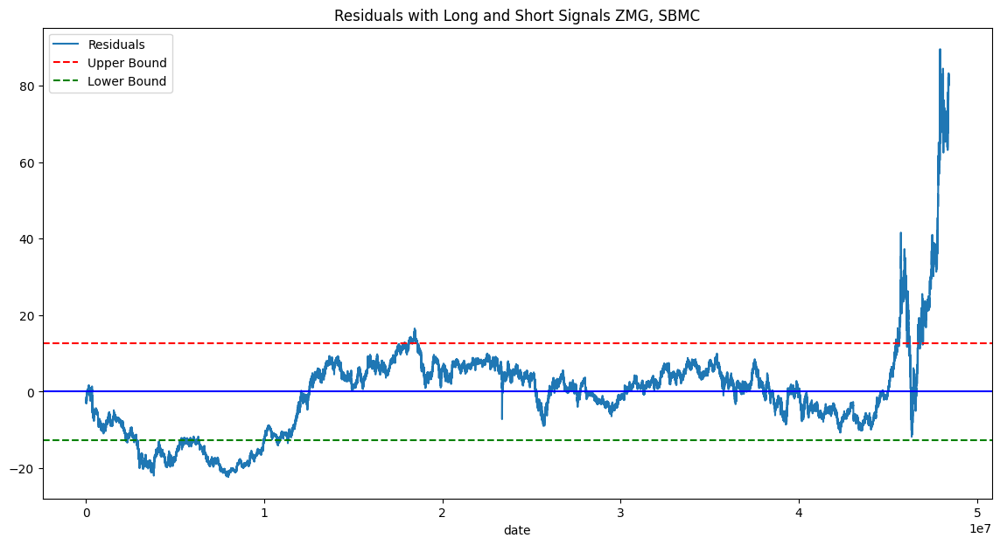

ETWC
ETWC CTEN


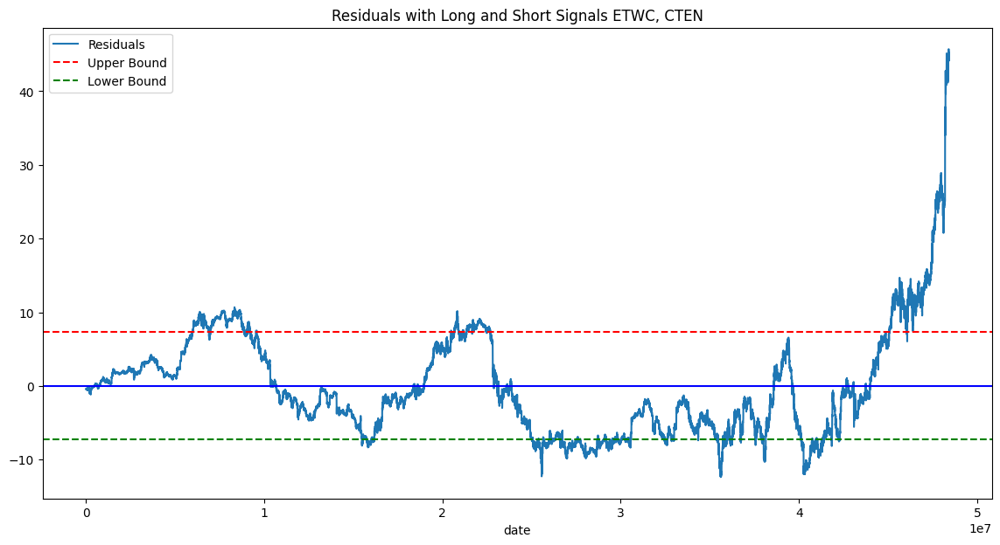

ETWC OTNW


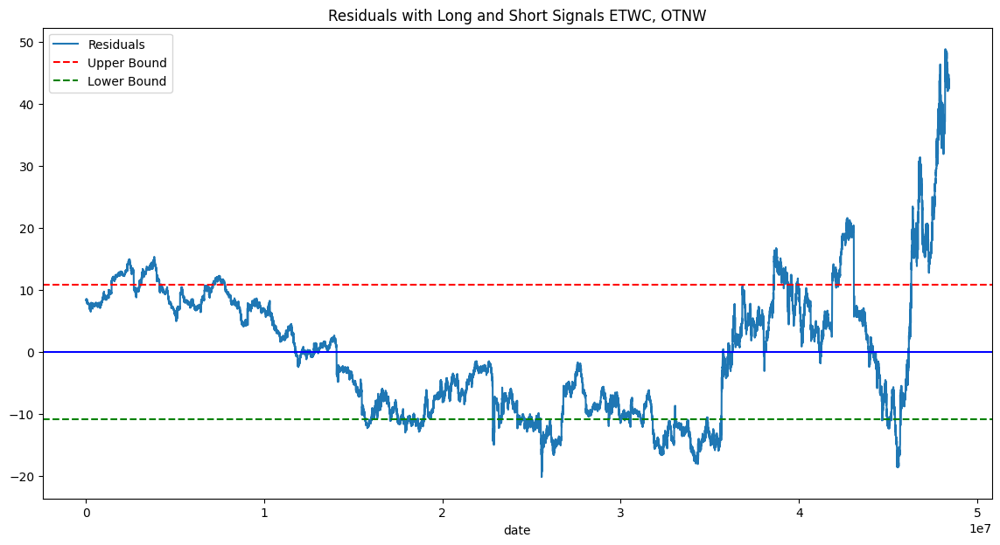

ETWC ZMG


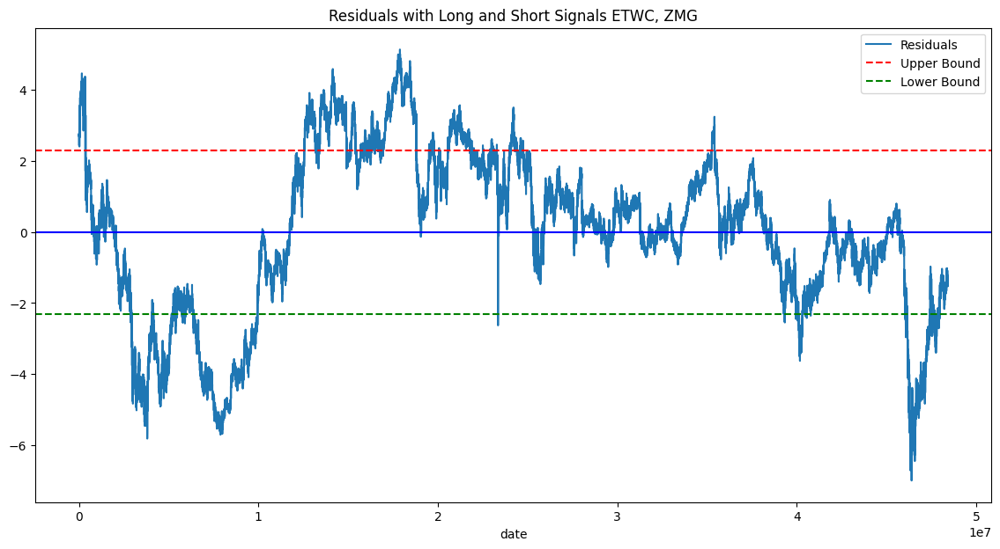

ETWC ABSI


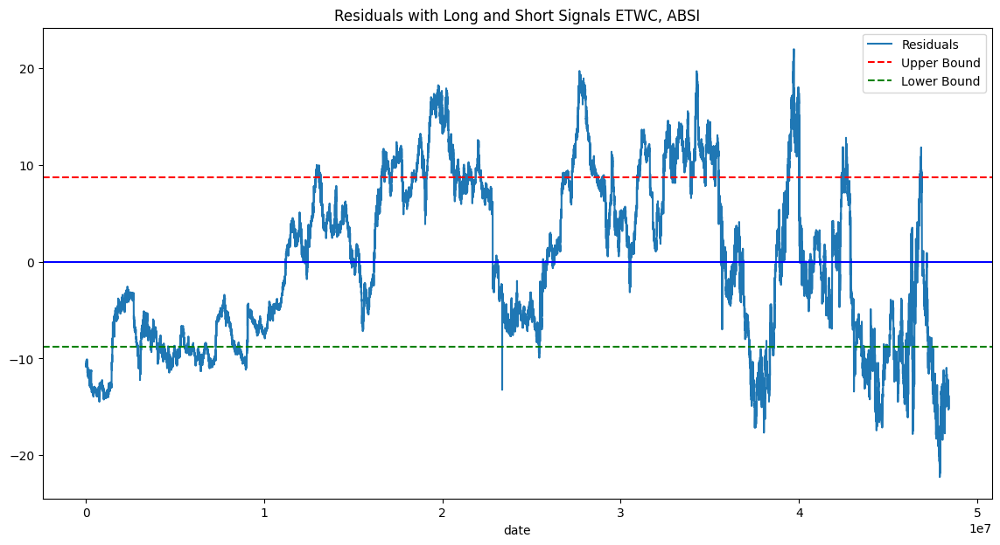

ETWC PFNC


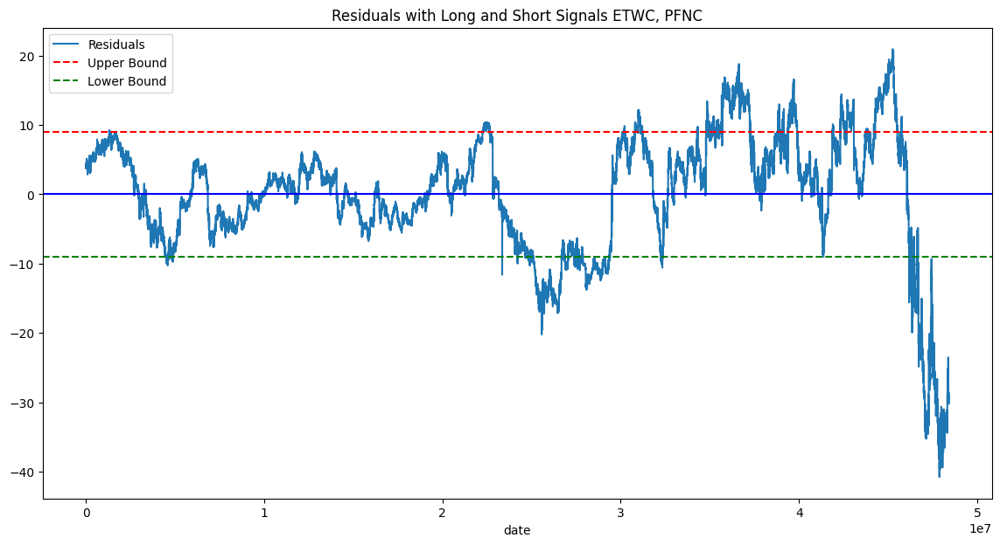

ETWC IRIN


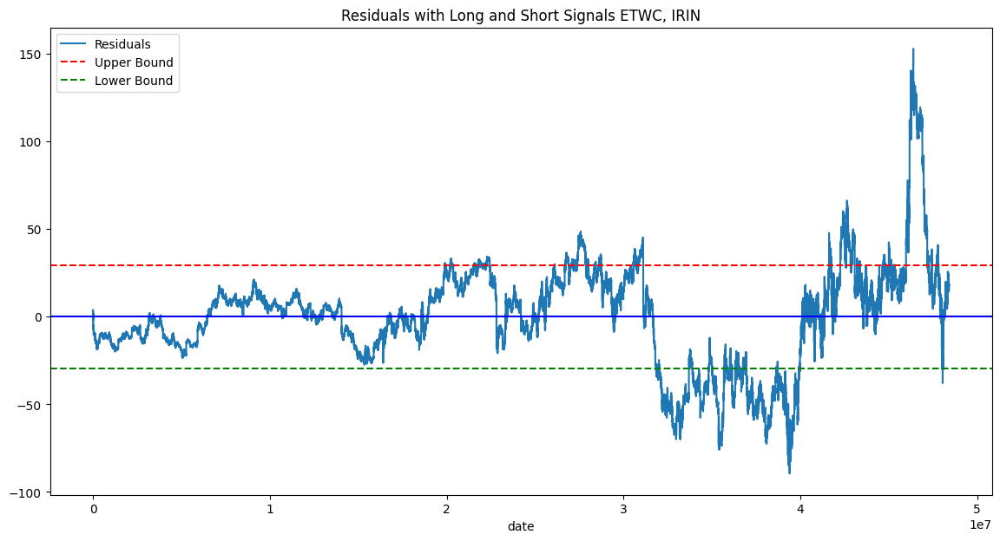

ETWC CNSC


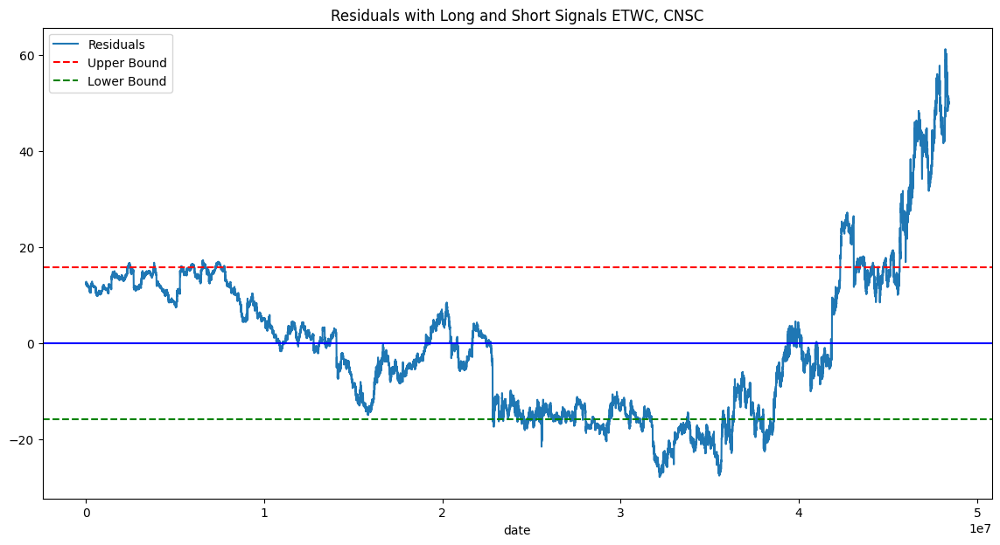

ETWC PXGL


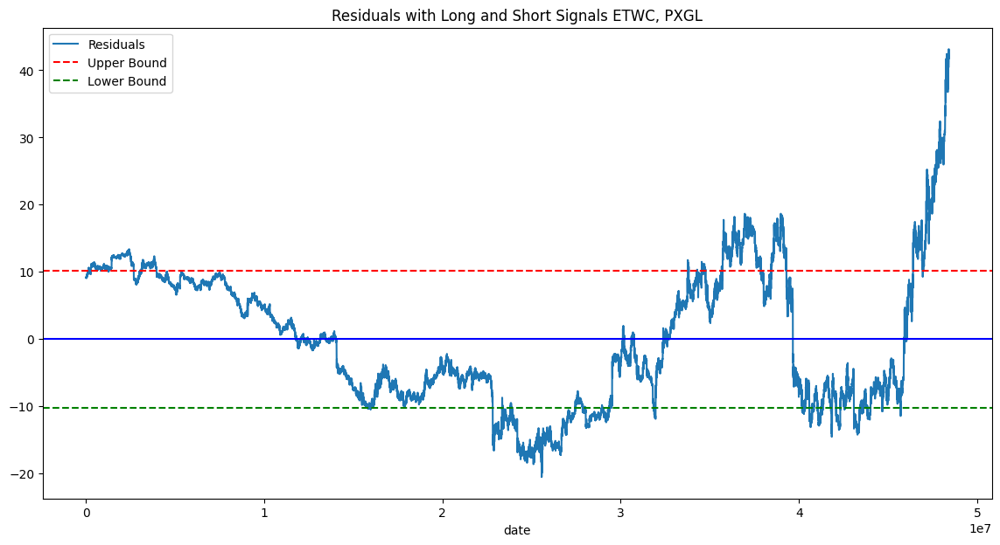

ETWC SBMC


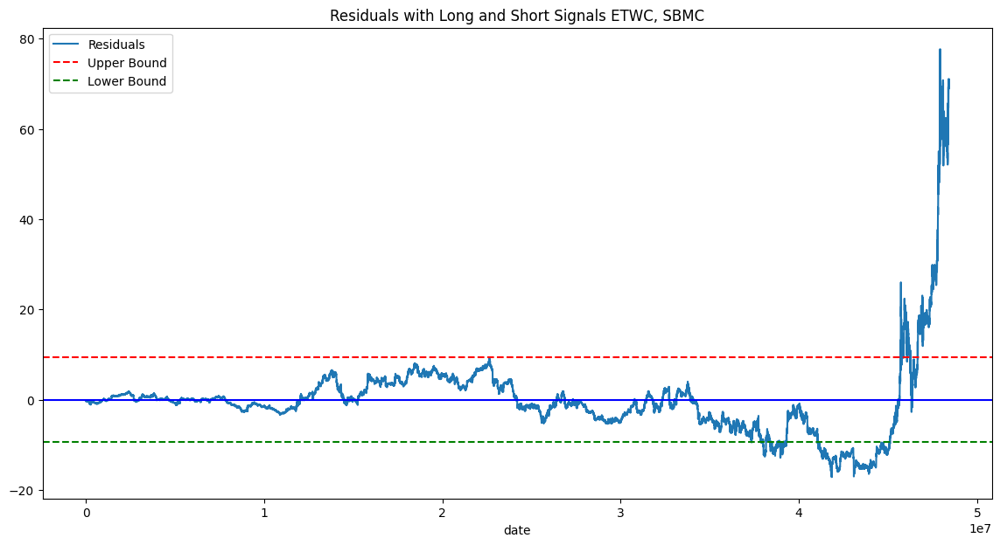

ABSI
ABSI CTEN


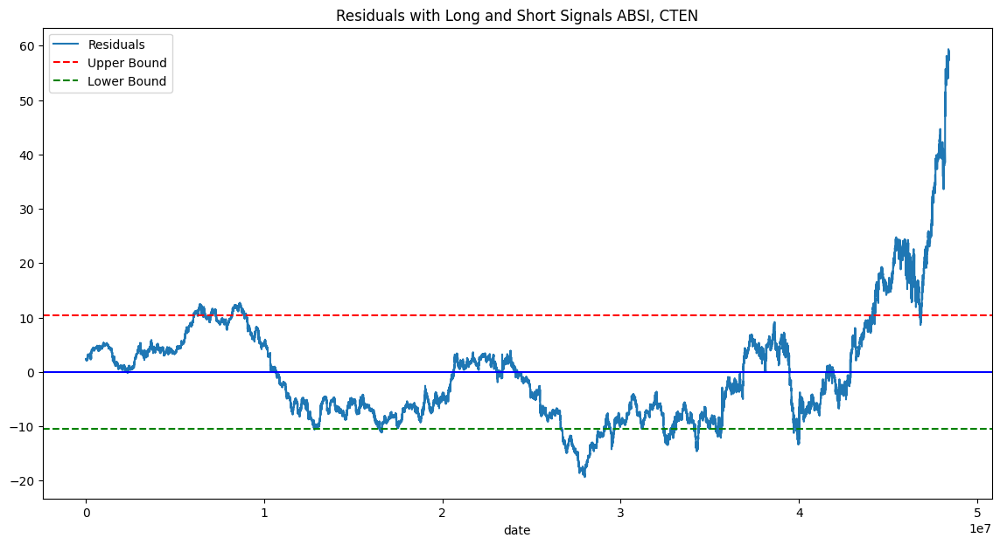

ABSI OTNW


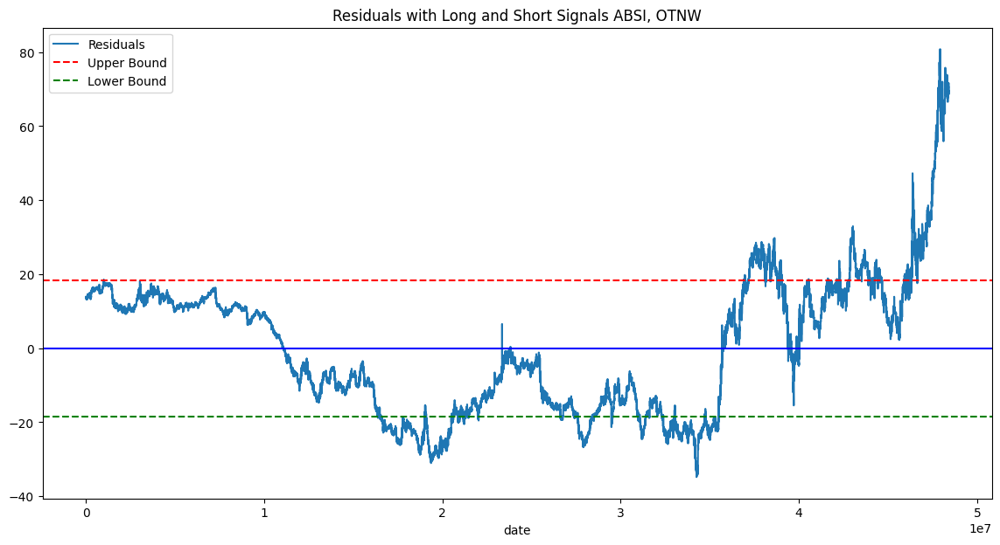

ABSI ZMG


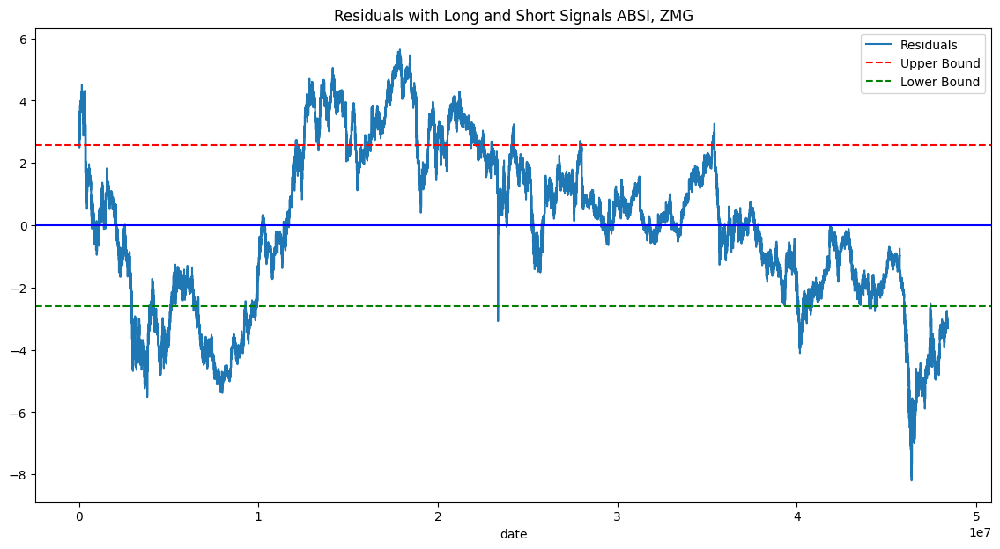

ABSI ETWC


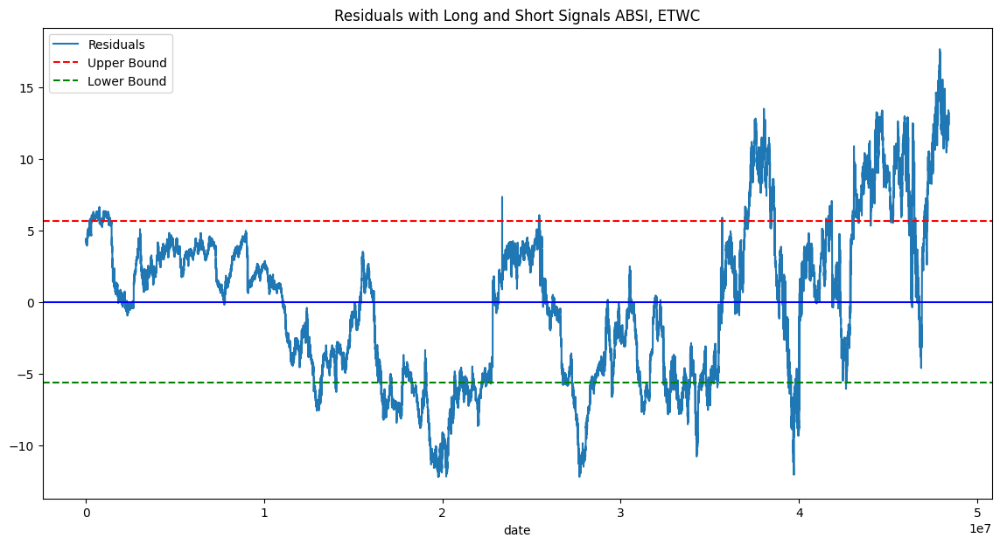

ABSI PFNC


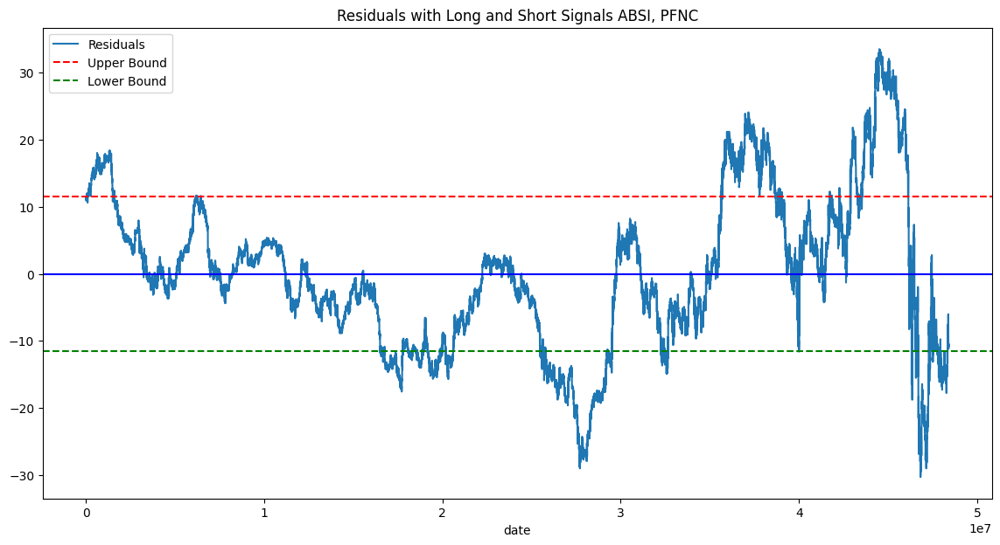

ABSI IRIN


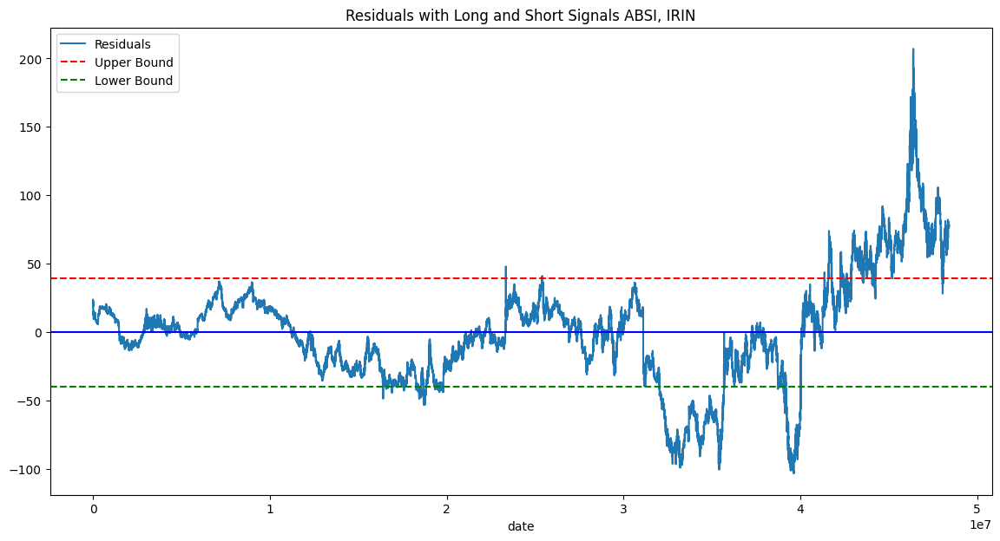

ABSI CNSC


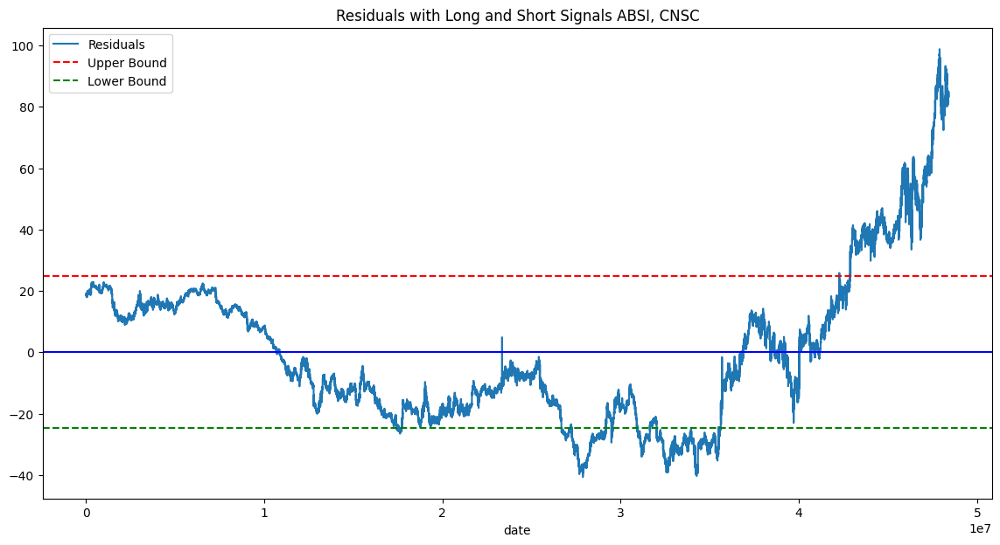

ABSI PXGL


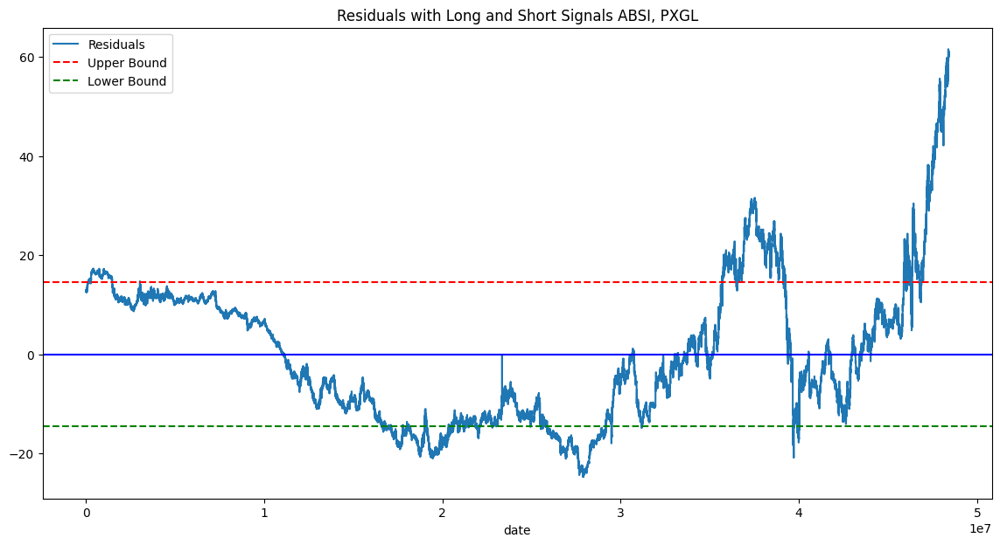

ABSI SBMC


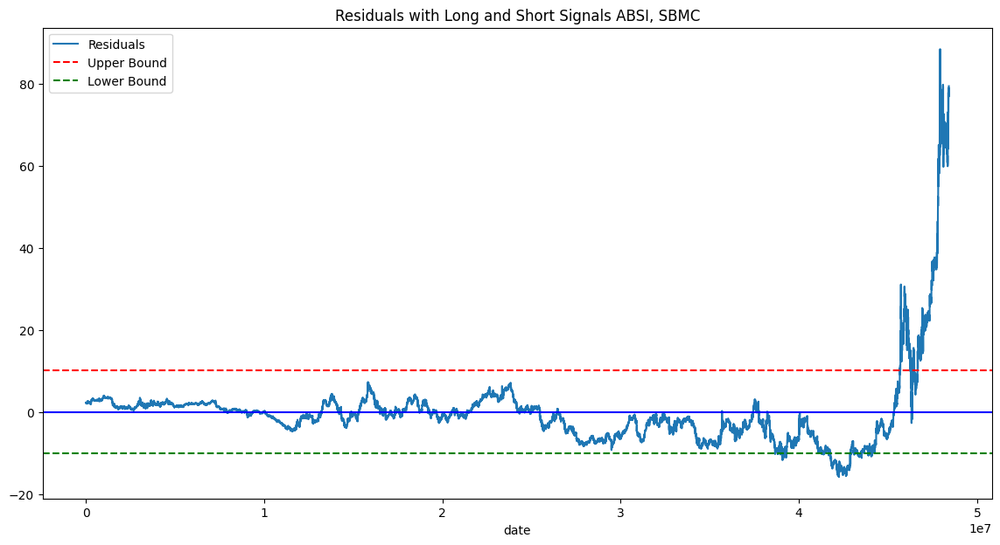

PFNC
PFNC CTEN


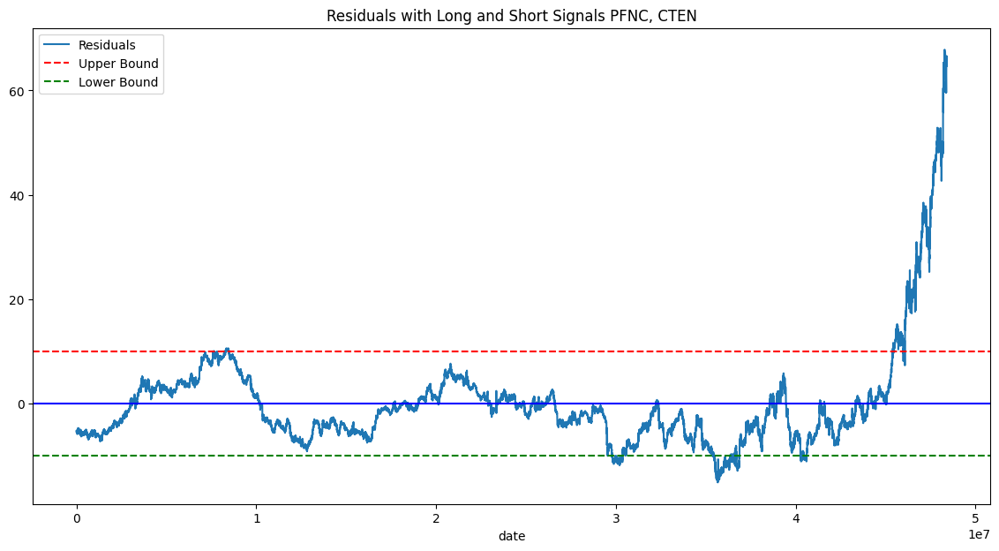

PFNC OTNW


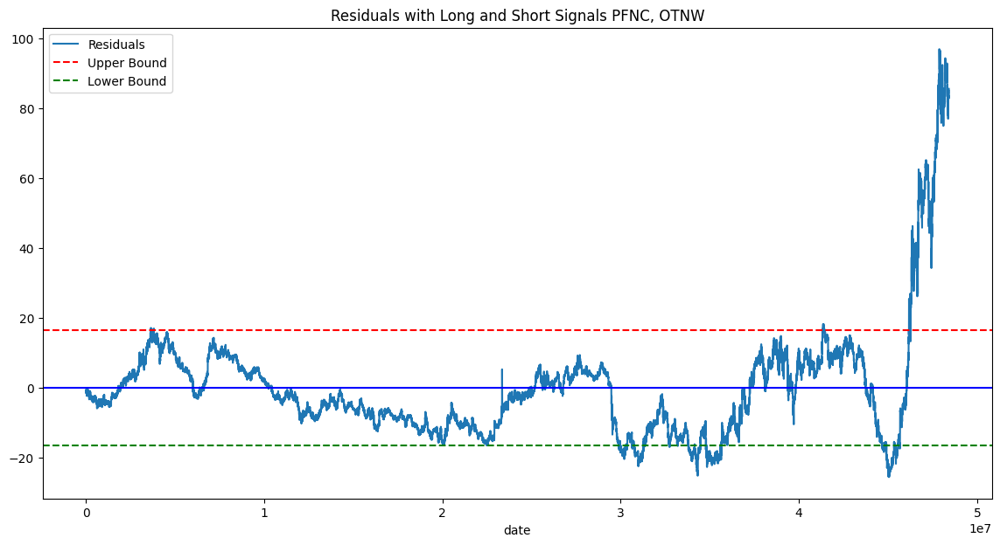

PFNC ZMG


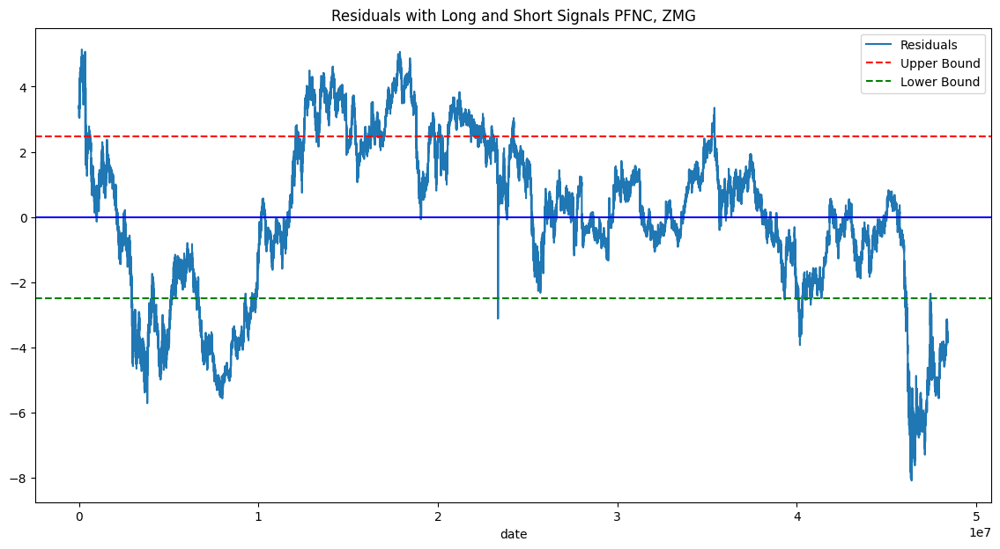

PFNC ETWC


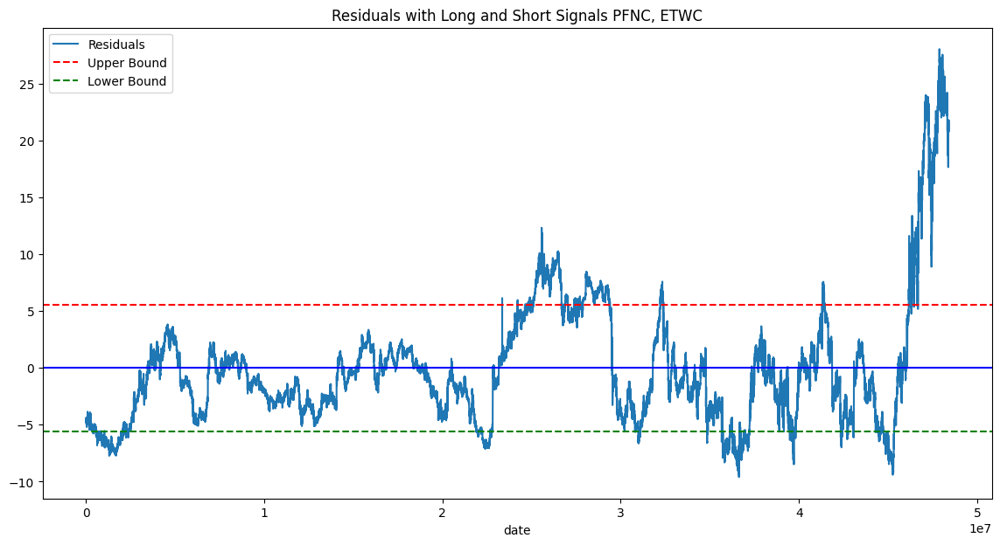

PFNC ABSI


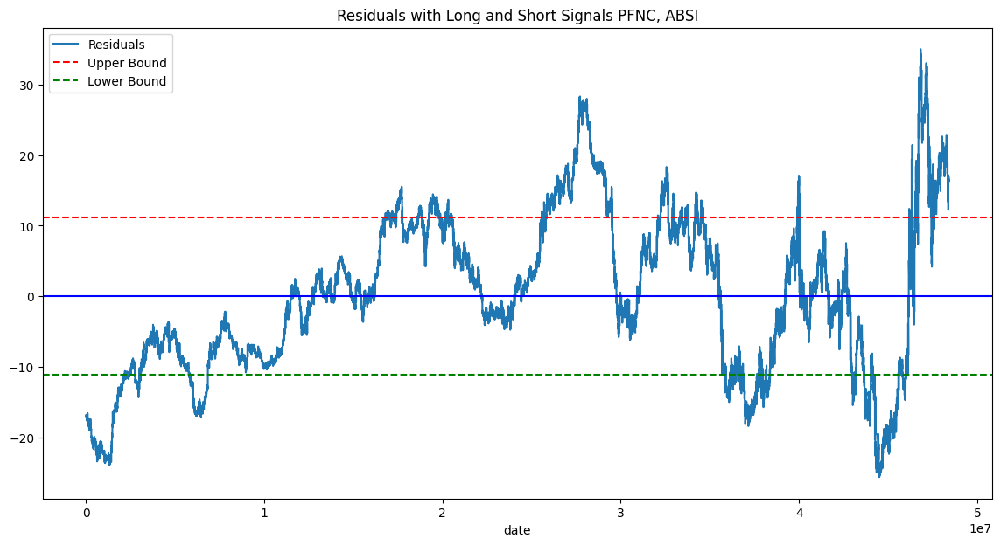

PFNC IRIN


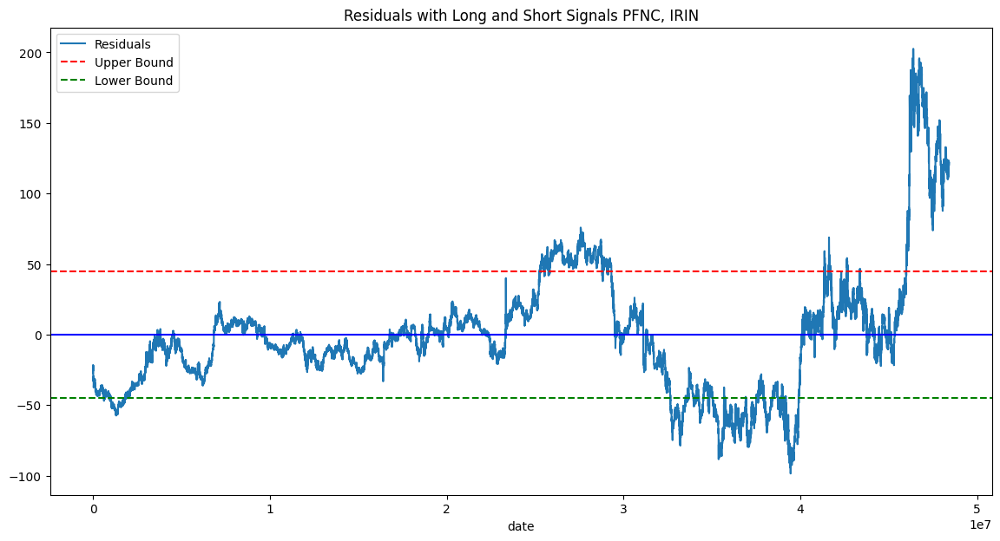

PFNC CNSC


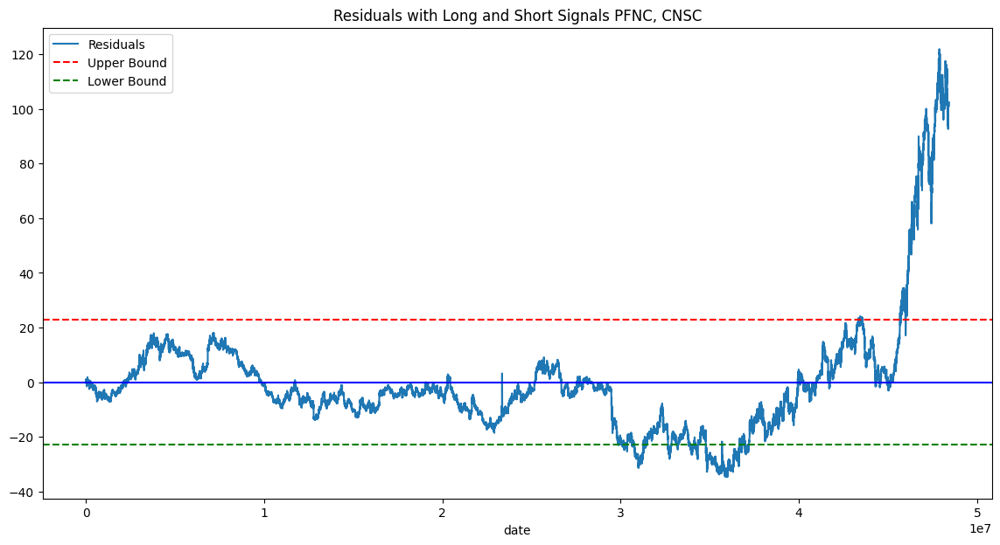

PFNC PXGL


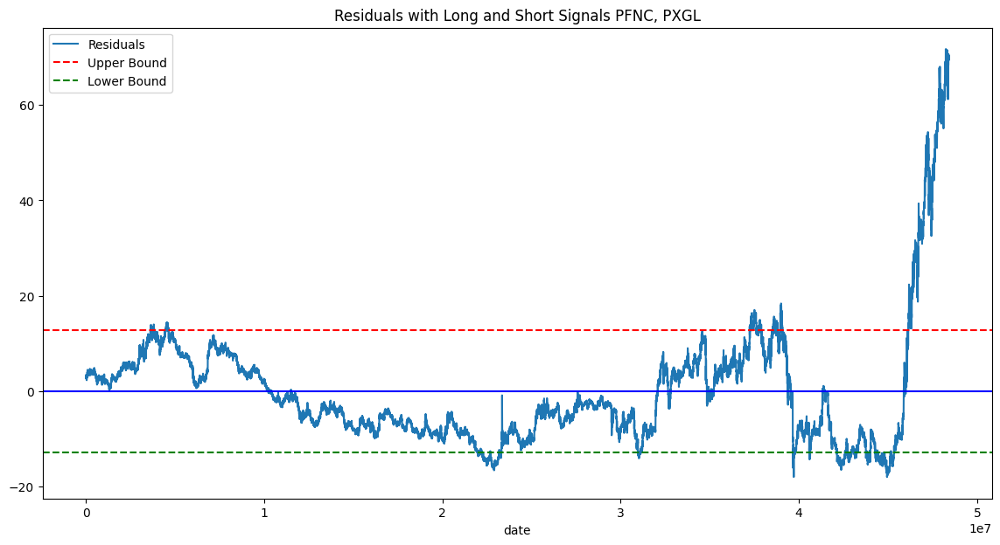

PFNC SBMC


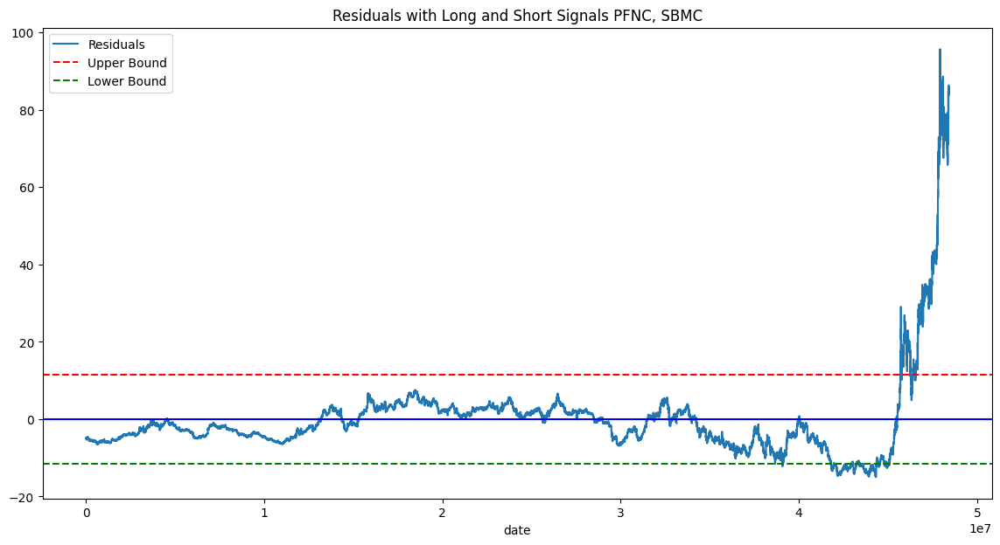

IRIN
IRIN CTEN


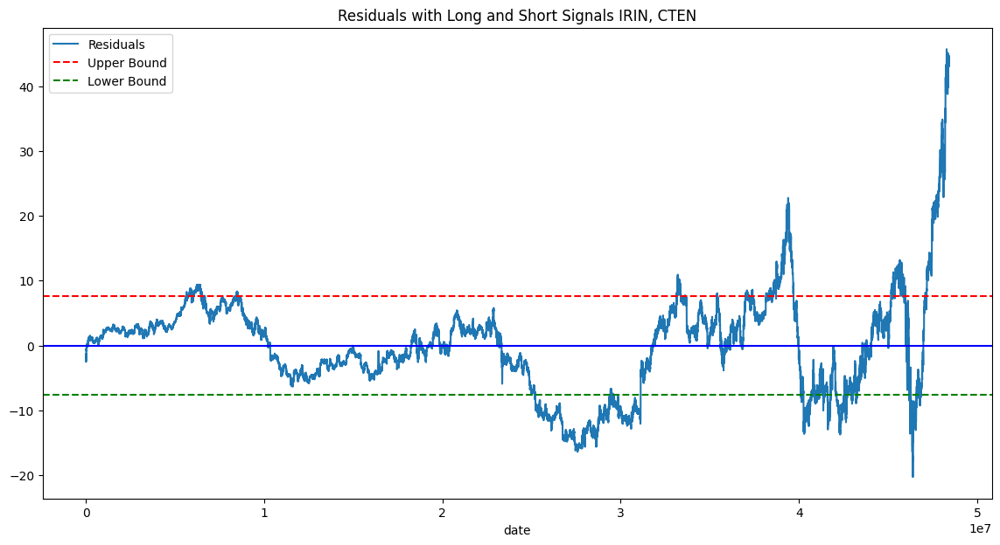

IRIN OTNW


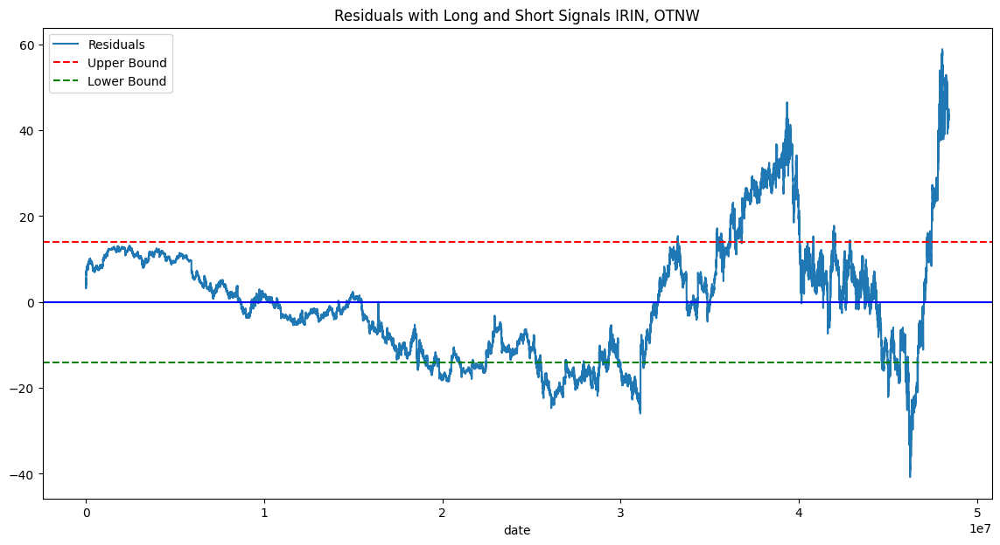

IRIN ZMG


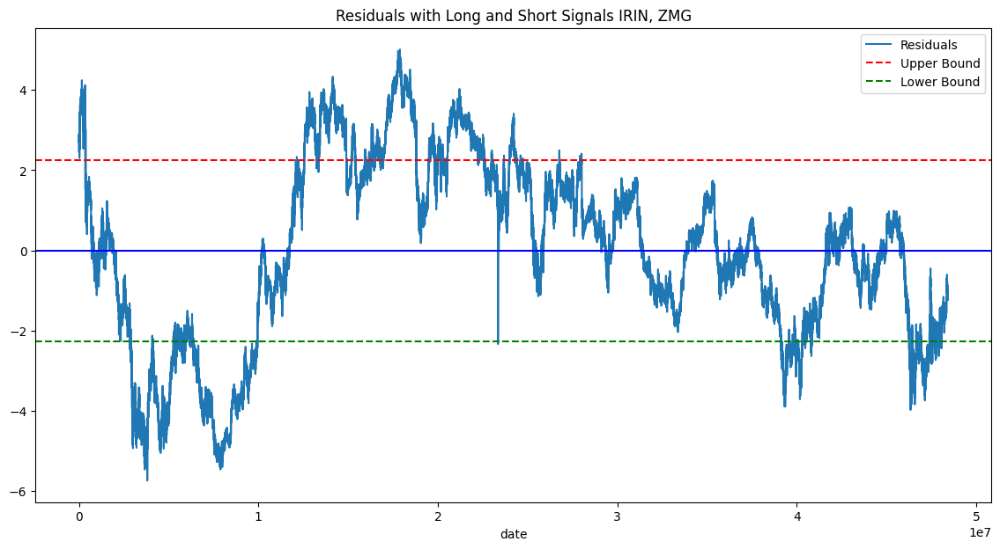

IRIN ETWC


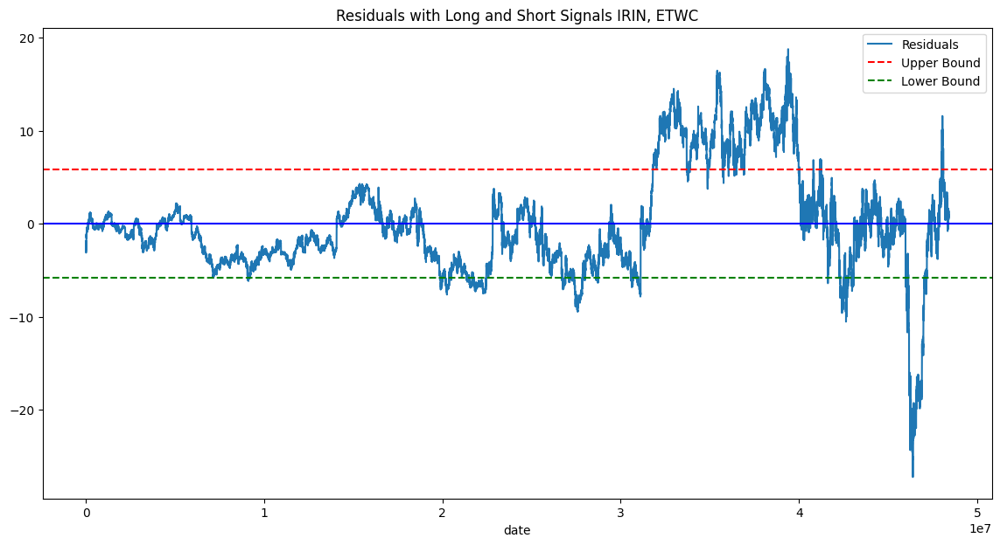

IRIN ABSI


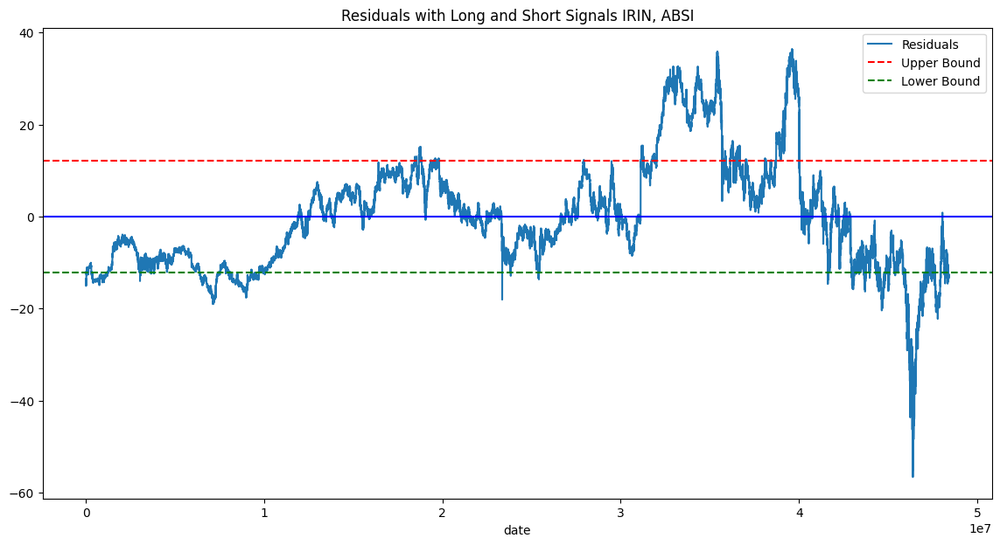

IRIN PFNC


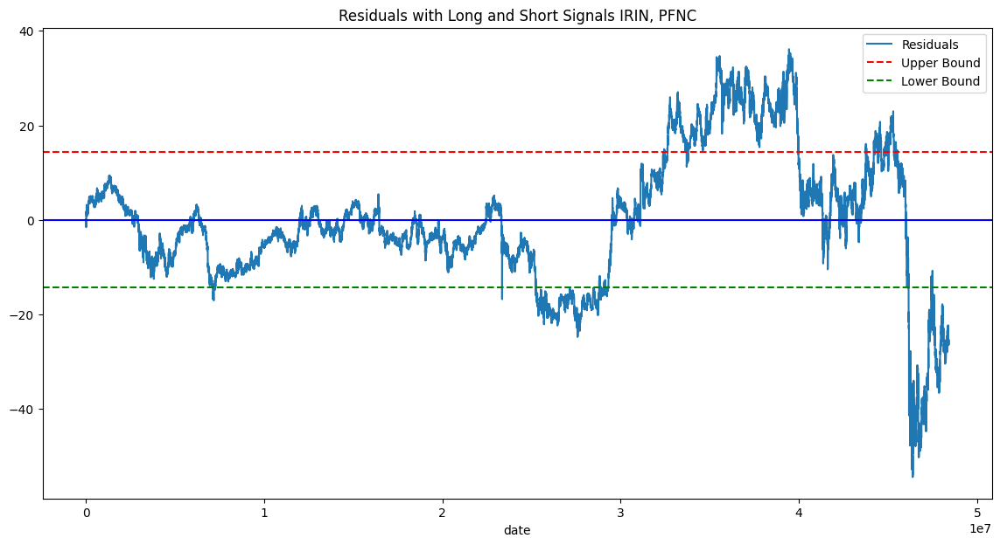

IRIN CNSC


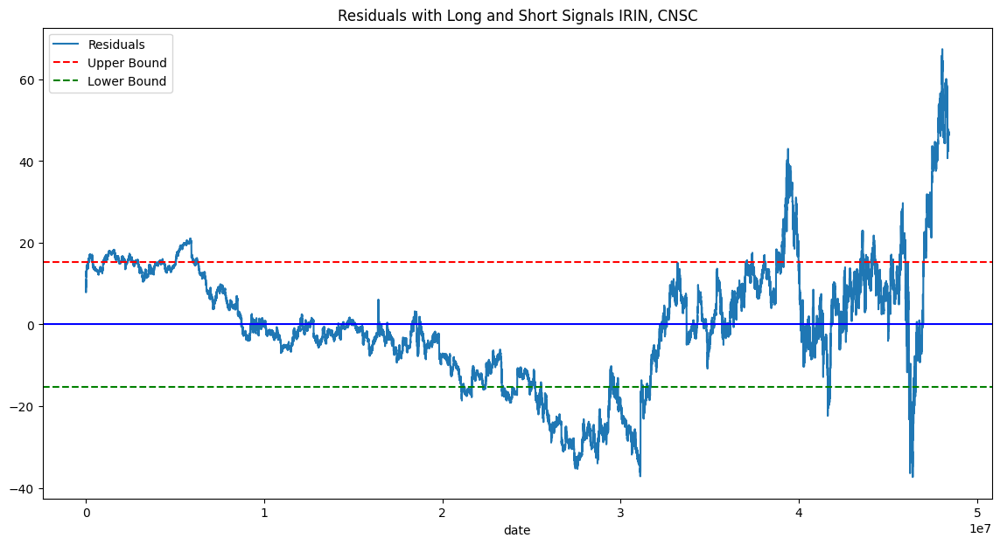

IRIN PXGL


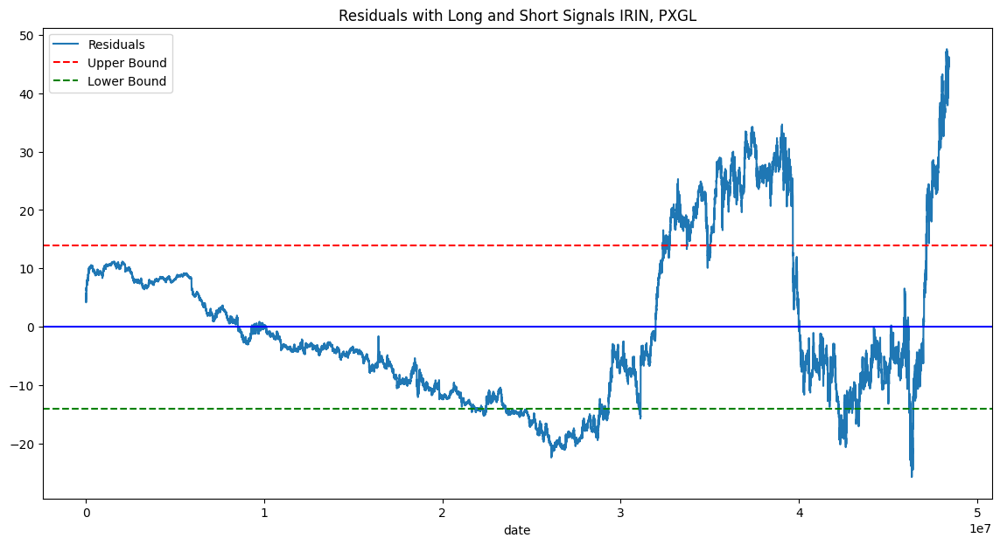

IRIN SBMC


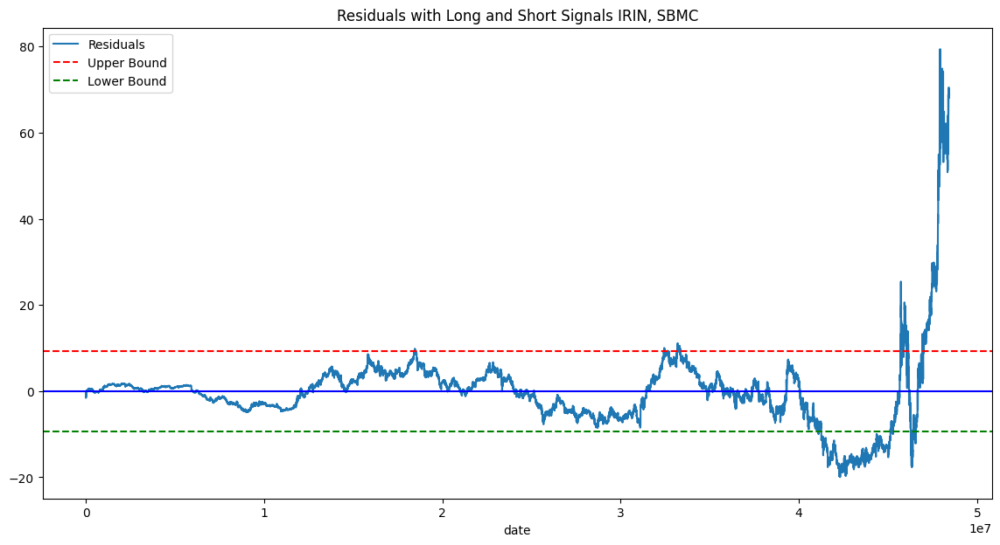

CNSC
CNSC CTEN


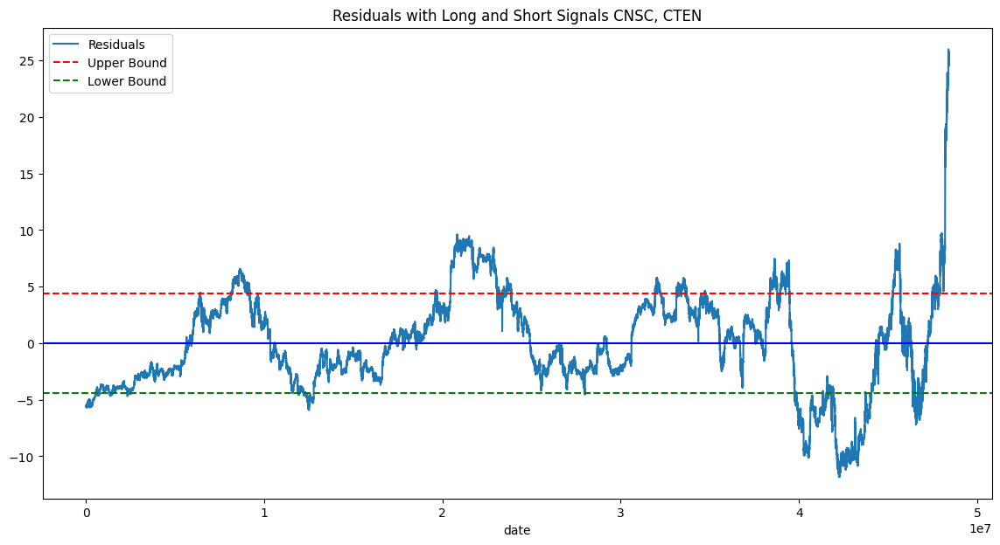

CNSC OTNW


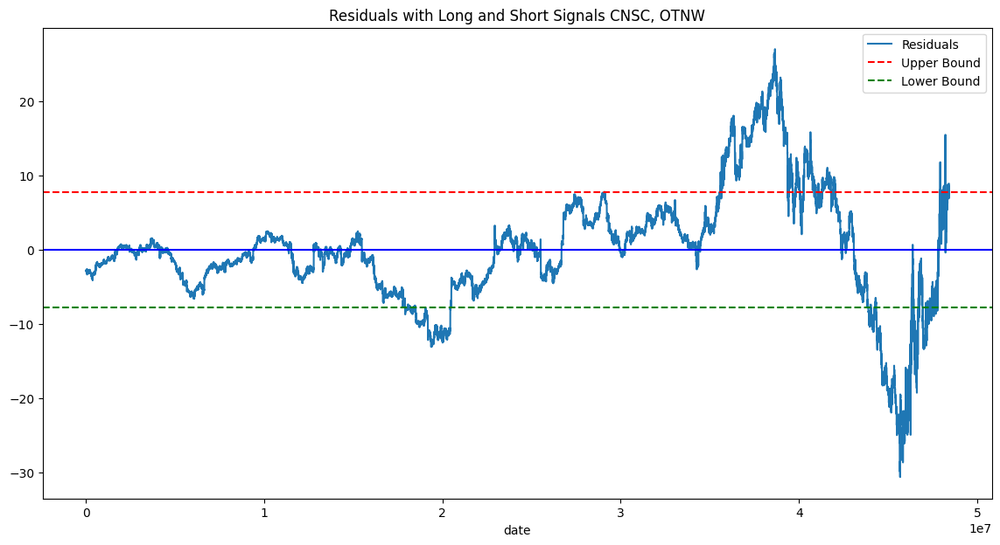

CNSC ZMG


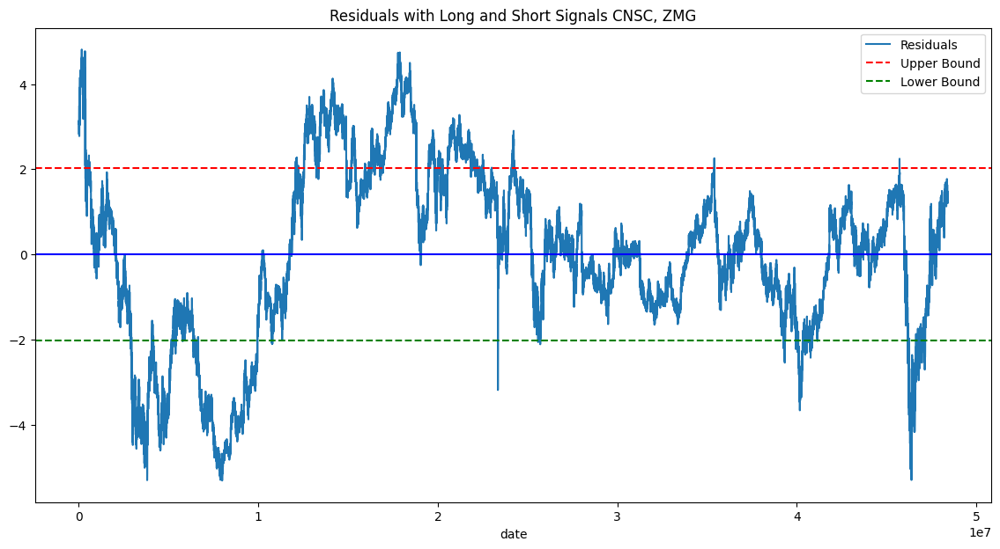

CNSC ETWC


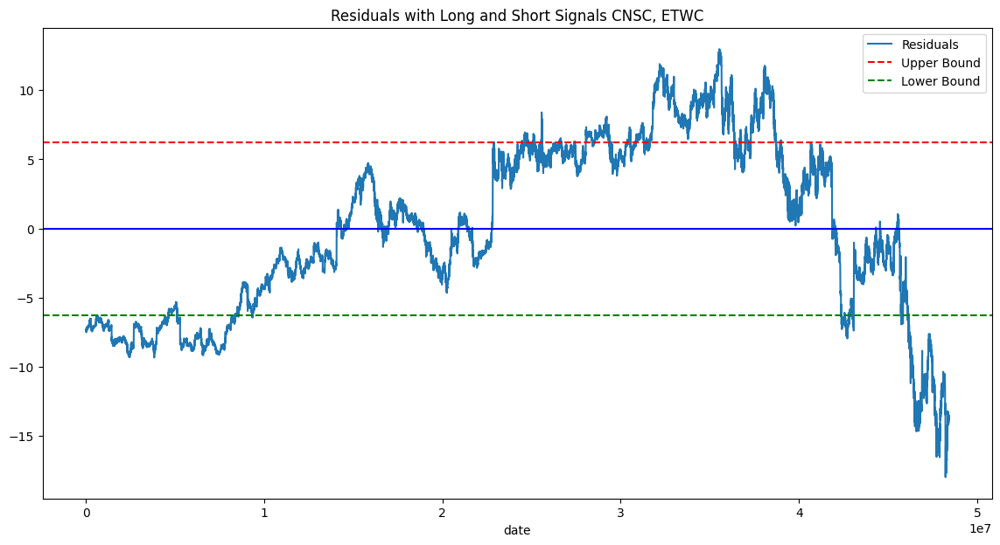

CNSC ABSI


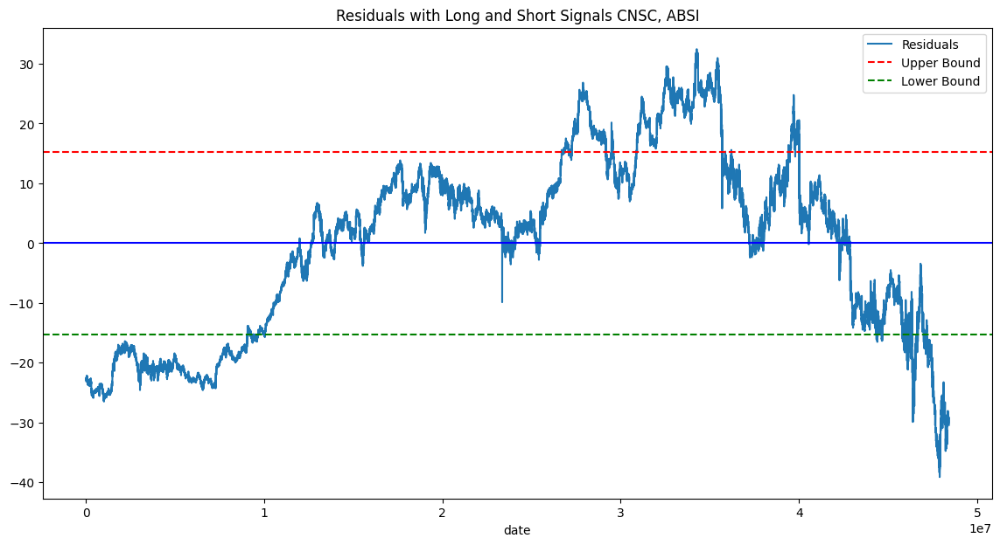

CNSC PFNC


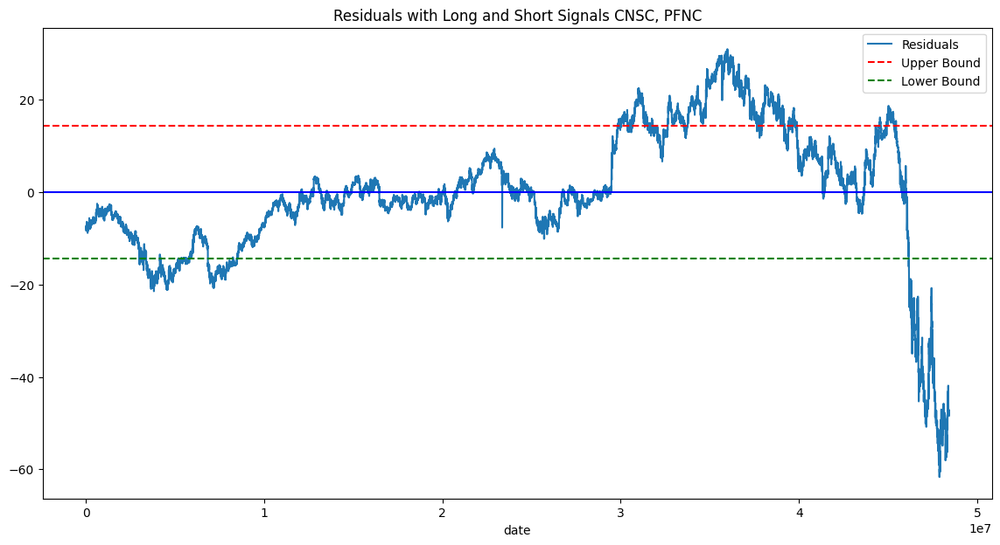

CNSC IRIN


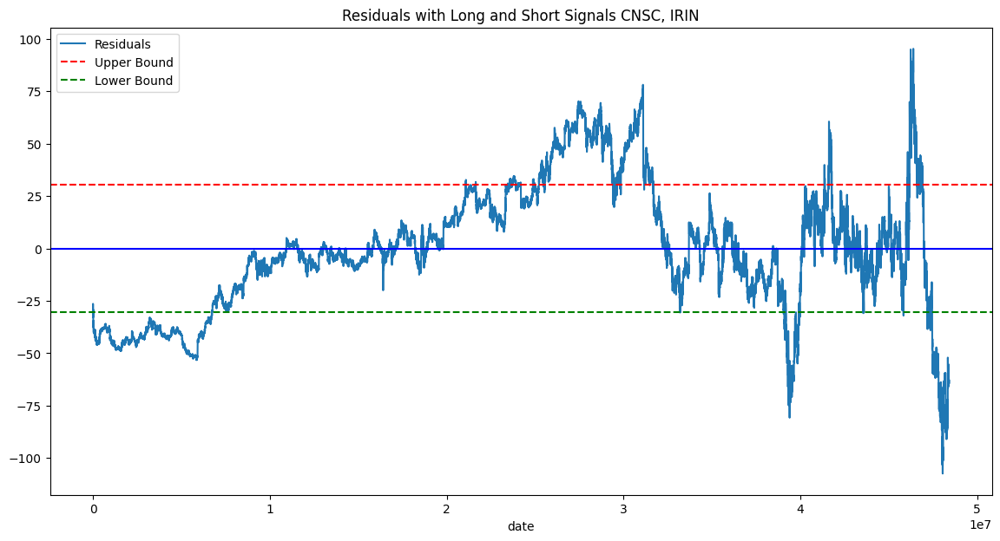

CNSC PXGL


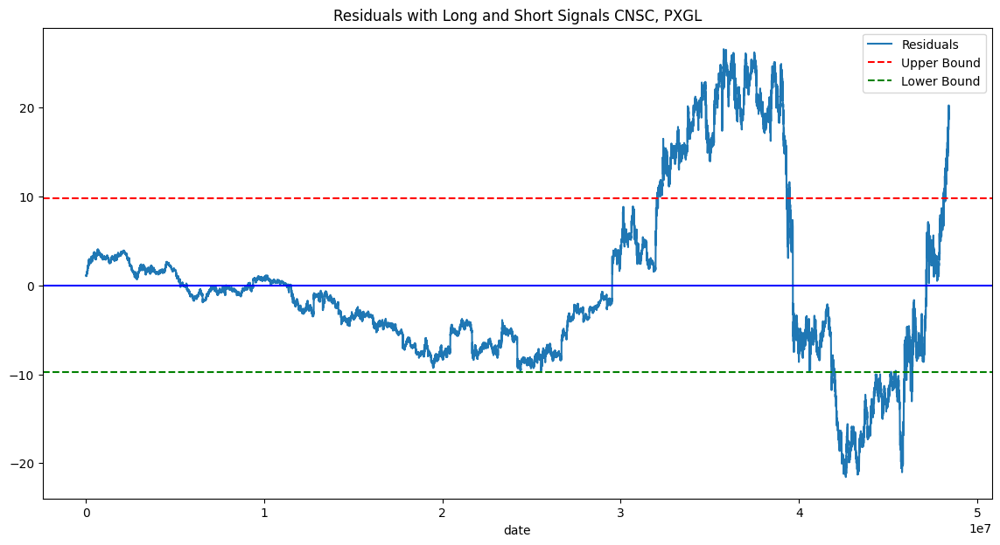

CNSC SBMC


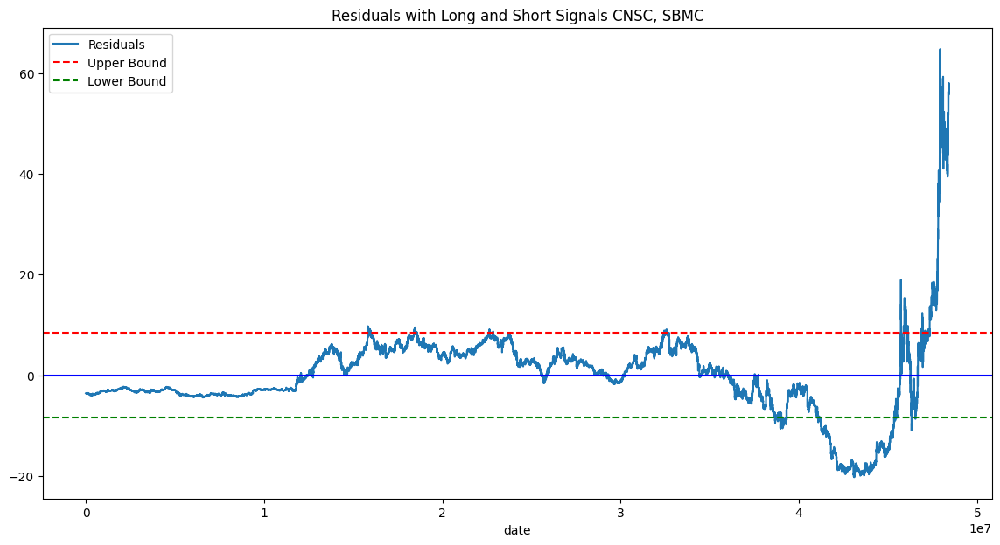

PXGL
PXGL CTEN


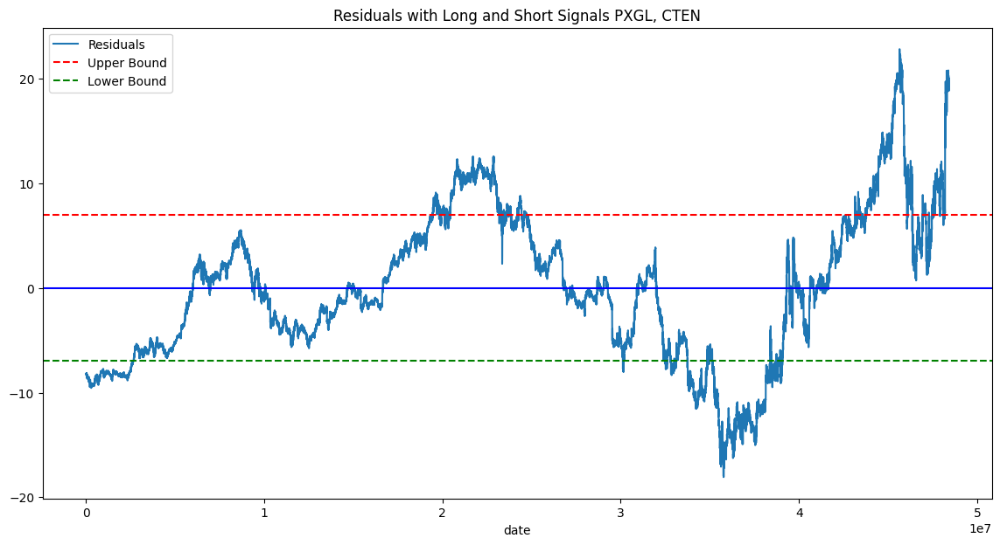

PXGL OTNW


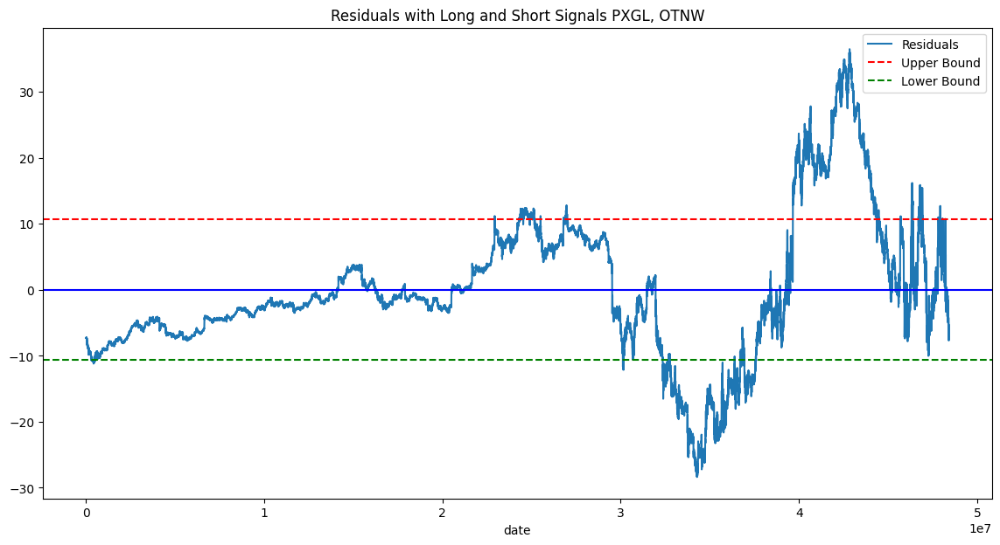

PXGL ZMG


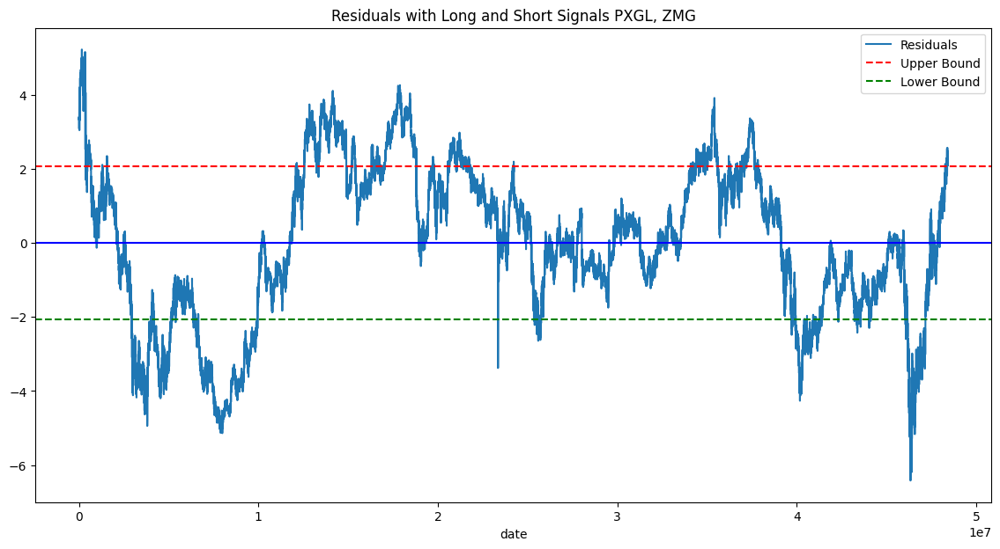

PXGL ETWC


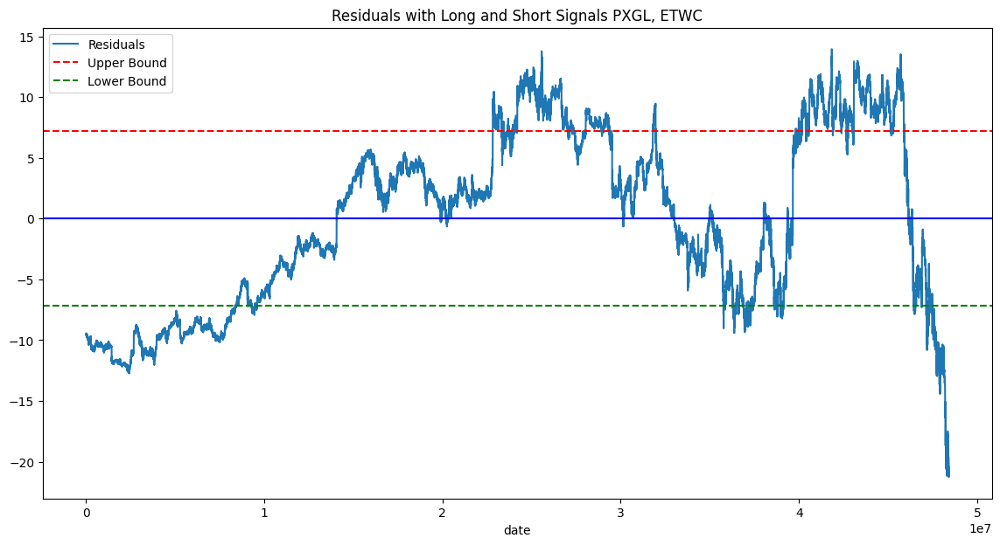

PXGL ABSI


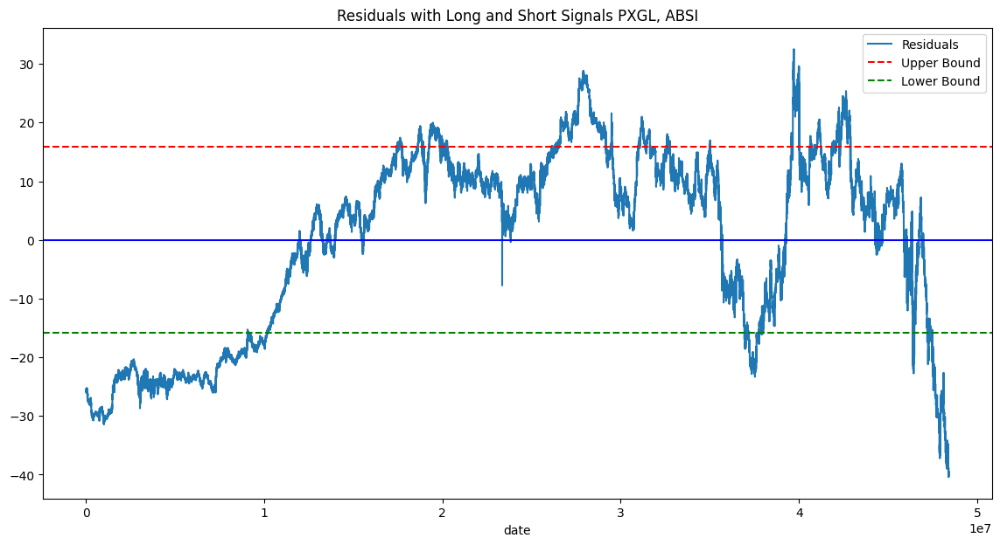

PXGL PFNC


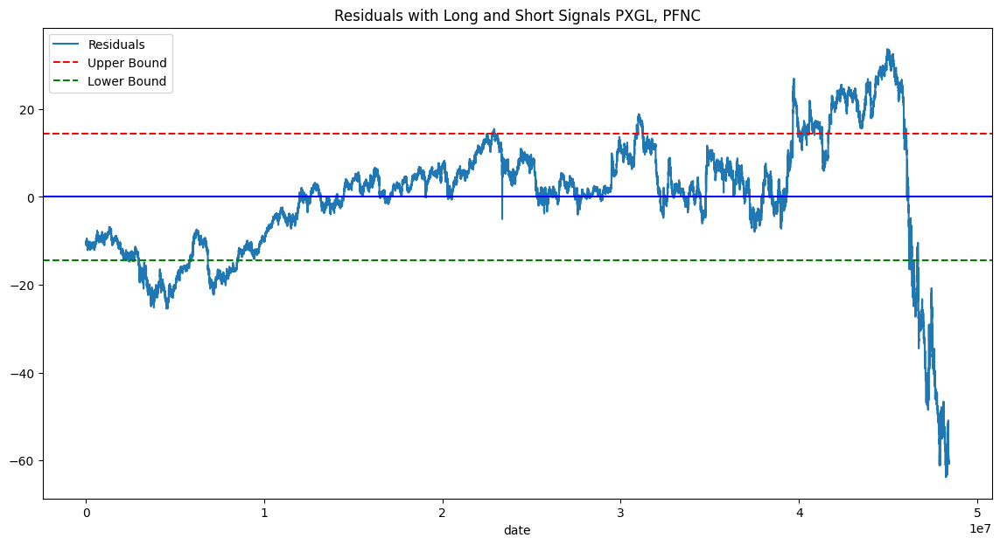

PXGL IRIN


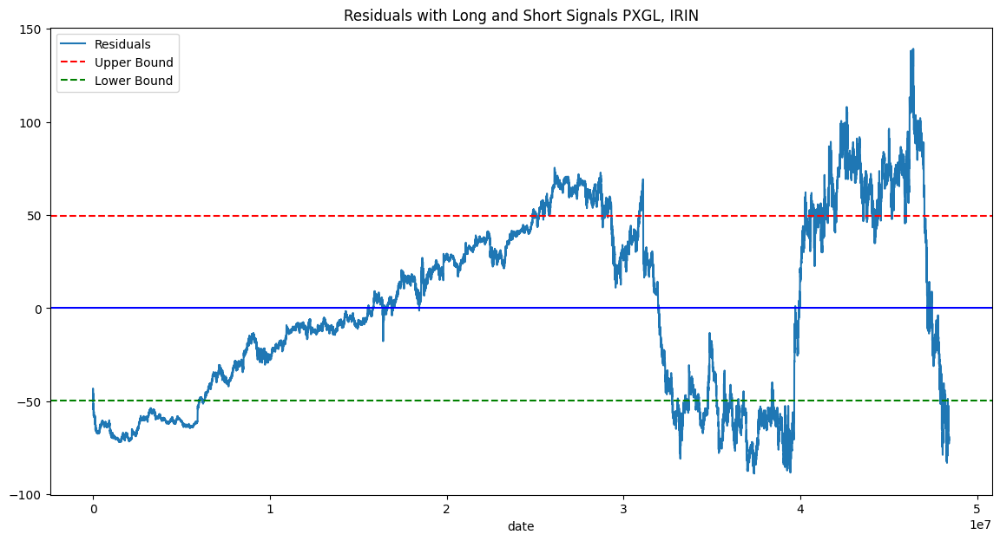

PXGL CNSC


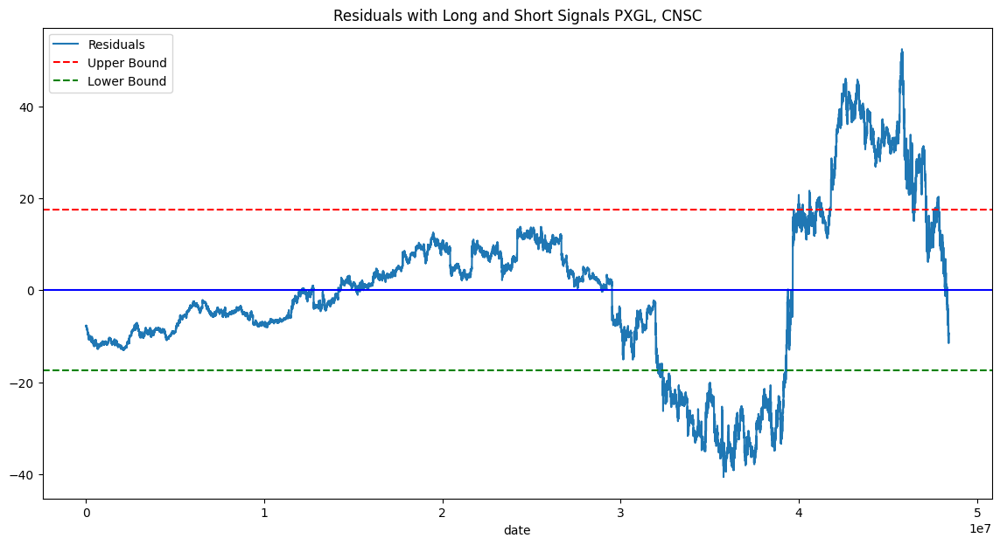

PXGL SBMC


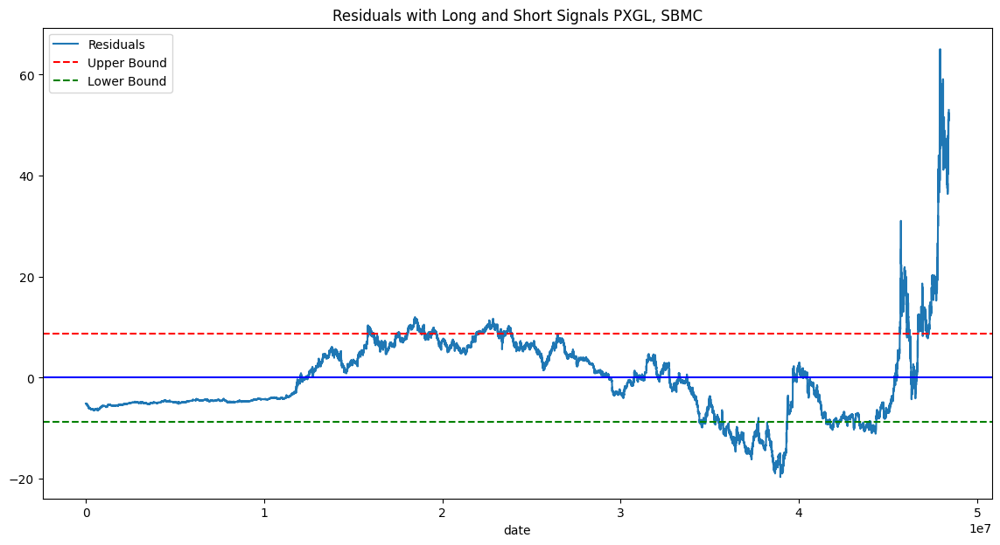

SBMC
SBMC CTEN


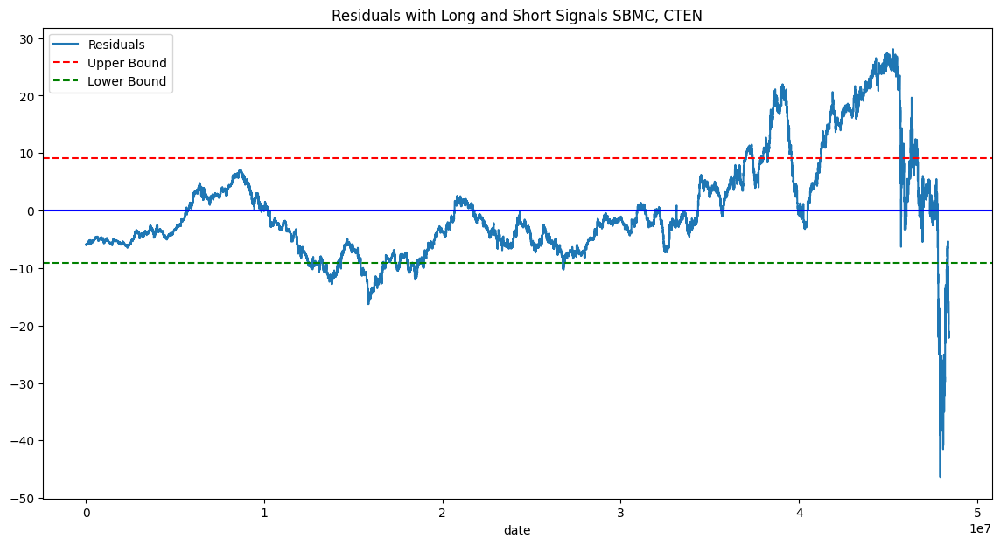

SBMC OTNW


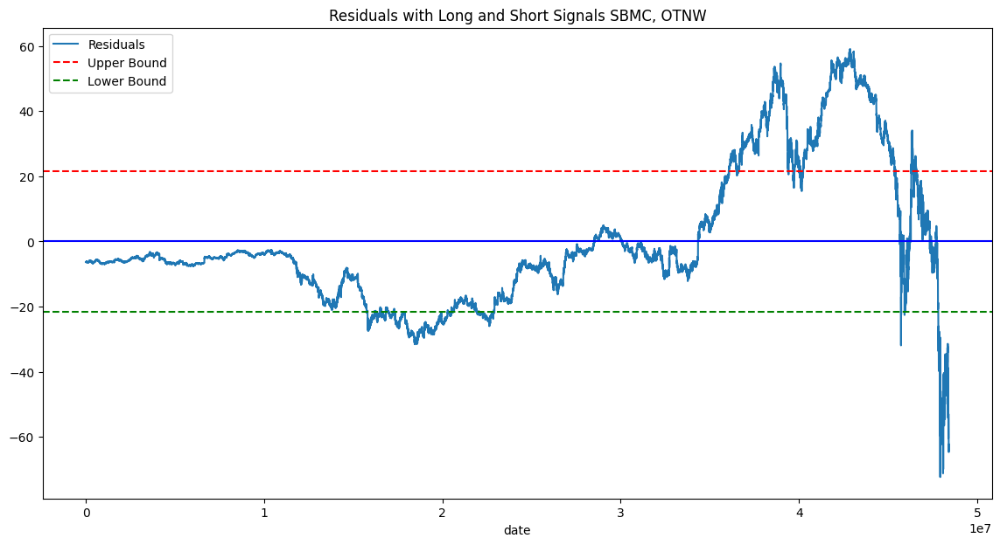

SBMC ZMG


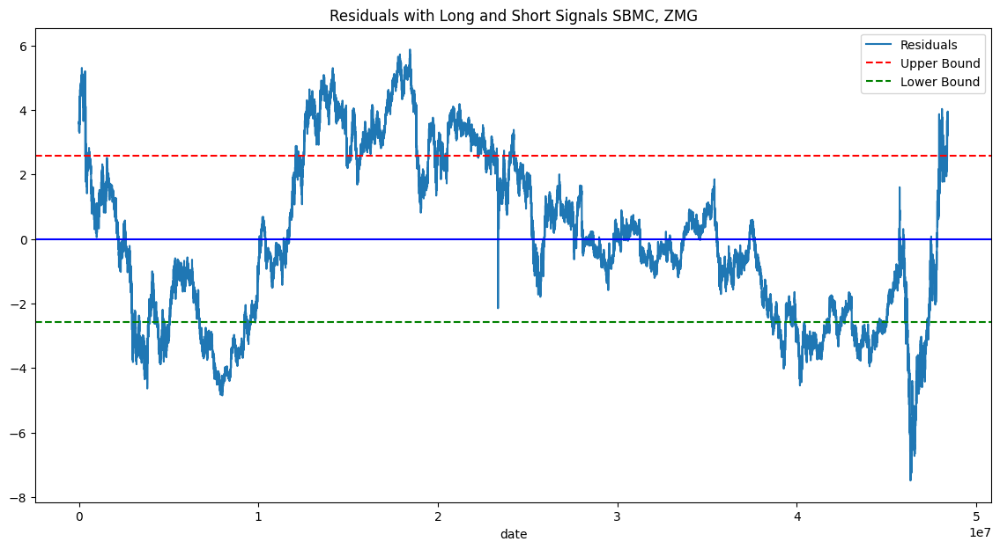

SBMC ETWC


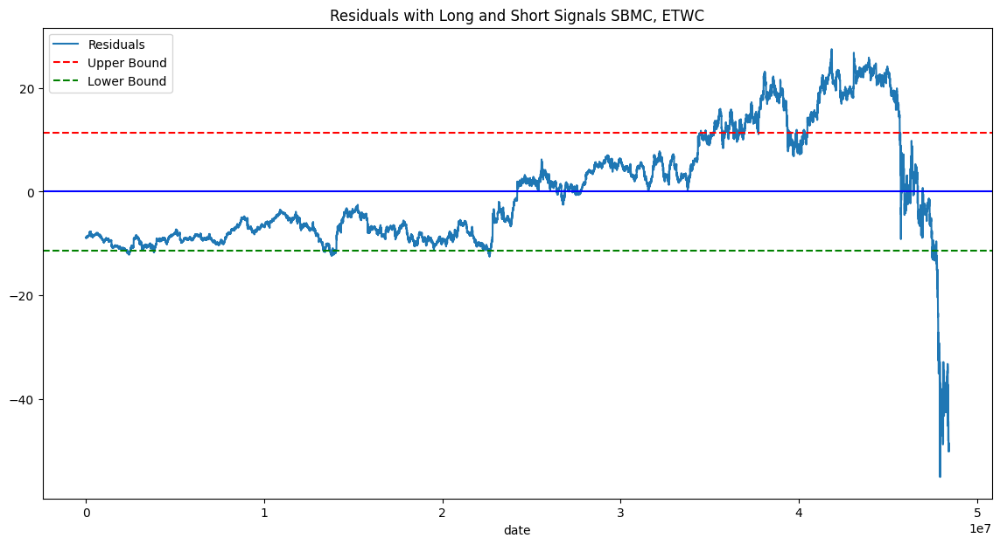

SBMC ABSI


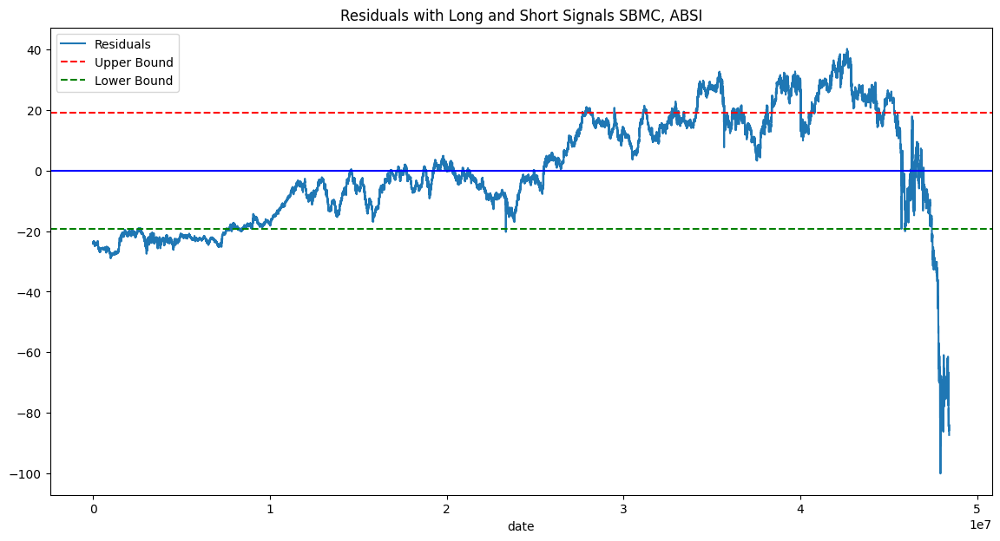

SBMC PFNC


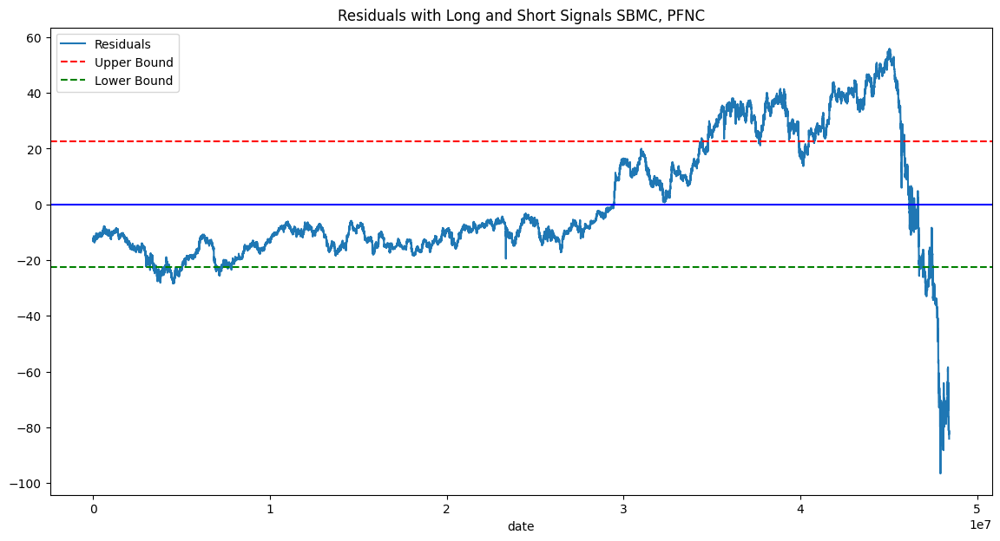

SBMC IRIN


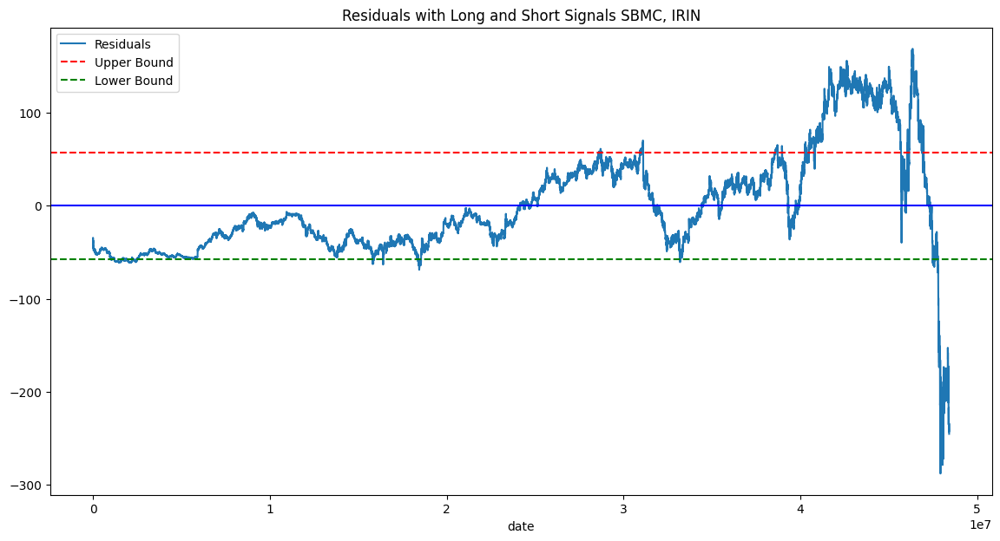

SBMC CNSC


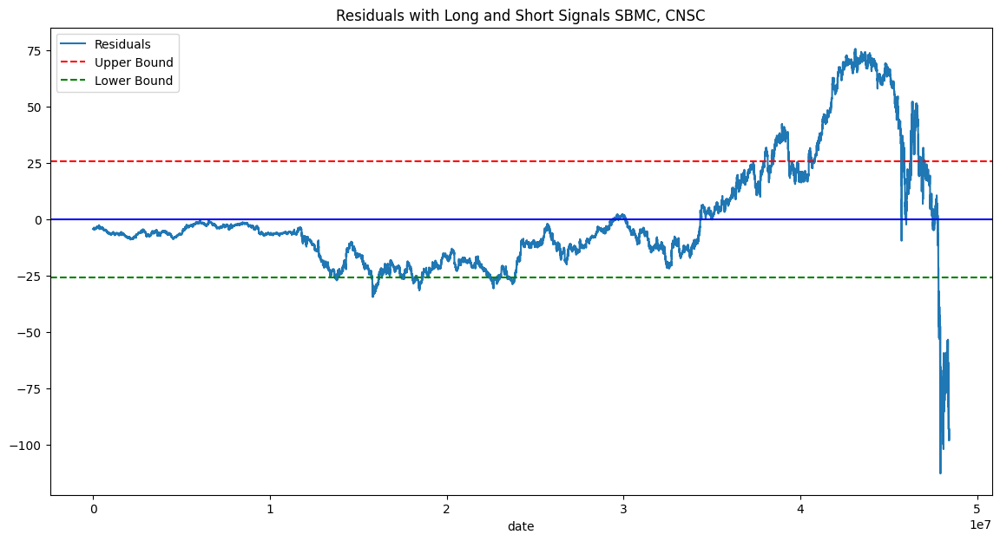

SBMC PXGL


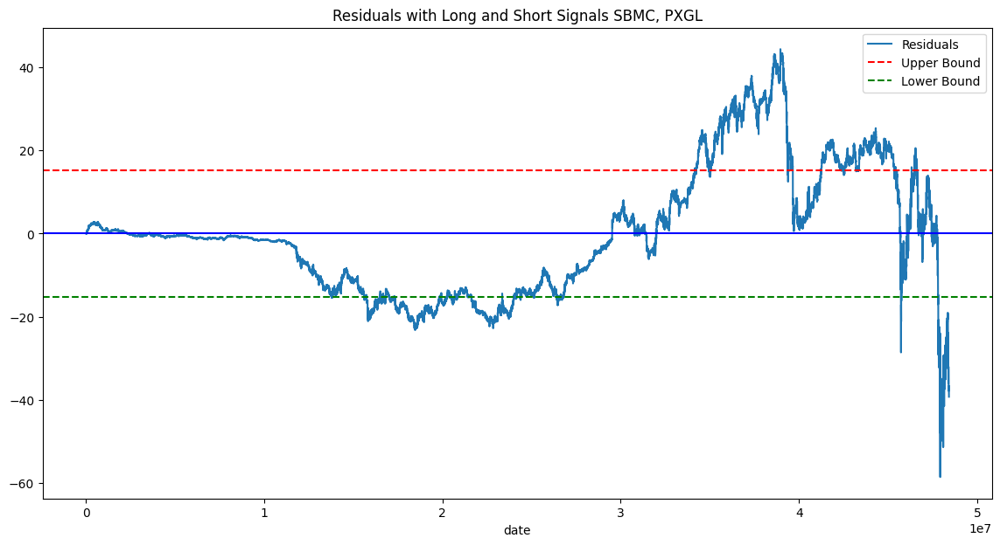

In [108]:
bound_dict = {}

for n1 in names:
    print(n1)
    for n2 in names:
        if n1 != n2:
            print(n1, n2)
            residuals = resid_dict[n1, n2]
            upper_bound, lower_bound, residuals_series = generate_signals(residuals, 1, historical_prices.index[1:-1], n1=n1, n2=n2)
            bound_dict[n1,n2] = {"upper": upper_bound, "lower": lower_bound}

<img src="https://algo-assets.amplifyme.com/quant/gresearch/GResearch_Cointegration_C4.png" width="100%"/>

## Trading Application 

Backtesting is a cornerstone of algorithmic trading. Before deploying a strategy in real-time, it’s imperative to understand how it would have performed historically. This process involves simulating trades based on past data and analyzing the results to evaluate the strategy’s robustness, potential profitability, and associated risks. In this section, we will immerse ourselves in the intricacies of backtesting, ensuring that our strategy is not just theoretically sound but also practical and viable in real-world scenarios. By understanding its historical behavior, we can make more informed decisions about its future deployment.

#### Class TradingEngine

The engine class is used to simulate a high-frequency trading strategy. It contains the following properties:

* balance (float): The balance of the trading account, in dollars.
* profit_loss (float): The profit and loss of the trading account, in dollars.
* profit_loss_without_commission (float): The profit and loss without the commission deductions, in dollars.
* current_positions (dict): A dictionary of CurrentPosition objects, with each key representing a different asset.
* commission_costs (float): The commission costs in dollars.
* commission_percentage (float): The commission percentage to be applied to each trade, expressed

##### **Functions**

```python
execute_order(self, ticker: str, volume: int, action: str, date: int)
```
This function allows the execution of a trade order for a specific stock represented by ticker.

*Parameters:*
* ticker: a string representing the stock's ticker symbol. The symbol will be automatically converted to uppercase.
* volume: an integer representing the number of shares to be traded.
* action: a string representing the type of order to be executed. Acceptable values are BUY or SELL. The action will be automatically converted to uppercase.
* date: an integer representing the date of the trade.

*Returns:*
Based on the current position of the stock and the action provided, the function will determine the trade to be executed. If the function fails to execute you will see an error is raised.

<hr>

#### Class CurrentPosition

The CurrentPosition class is used to track and manage the positions taken by the engine object. It contains the following properties:

* ticker (str): The ticker symbol of the asset being traded.
* direction (str): The direction of the trade, either "LONG", "SHORT", or "FLAT".
* position_volume (int): The number of shares held in the current position.
* open_price (float): The price at which the position was opened.
* profit_loss (float): The profit or loss in dollars, calculated as the difference between the open price and the current price.
* profit_loss_without_commission (float): The profit or loss in dollars without the commission deductions.
* commission_costs (float): The cumulative commission costs for this position.
* trade_history (list): A list of dictionaries, each representing a single trade in this position.

<hr>

In [153]:
class CurrentPosition:
    def __init__(self, ticker: str, direction: str = "FLAT", position_volume: int = 0, open_price: float = 0.0):
        """
        Initialize a new position for a given asset.
        
        :param ticker: The ticker symbol of the asset.
        :param direction: The trade direction, either "LONG", "SHORT", or "FLAT".
        :param position_volume: The number of shares held in the position.
        :param open_price: The price at which the position was opened.
        """
        self.ticker = ticker
        self.direction = direction  # Can be "LONG", "SHORT", or "FLAT"
        self.position_volume = position_volume  # Number of shares held
        self.open_price = open_price  # Price at which the position was opened
        self.profit_loss = 0.0  # Total profit or loss in dollars
        self.profit_loss_without_commission = 0.0  # P/L without commission
        self.commission_costs = 0.0  # Total commission costs
        self.trade_history = []  # History of trades in this position
    
    def update_position(self, price: float, volume: int, action: str, commission_percentage: float):
        trade = {"price": price, "volume": volume, "action": action}
        self.trade_history.append(trade)

        # Calculate commission cost
        commission = commission_percentage * price * volume
        self.commission_costs += commission

        # Update position based on the action
        if action == "BUY":
            if self.direction == "FLAT":
                self.open_price = price
                self.position_volume = volume
                self.direction = "LONG"
            elif self.direction == "LONG":
                # Averaging up/down the price when adding to a long position
                self.open_price = ((self.open_price * self.position_volume) + (price * volume)) / (self.position_volume + volume)
                self.position_volume += volume
            elif self.direction == "SHORT":
                self.close_short_position(price, volume)
                
        elif action == "SELL":
            if self.direction == "FLAT":
                self.open_price = price
                self.position_volume = volume
                self.direction = "SHORT"
            elif self.direction == "SHORT":
                # Averaging up/down the price when adding to a short position
                self.open_price = ((self.open_price * self.position_volume) + (price * volume)) / (self.position_volume + volume)
                self.position_volume += volume
            elif self.direction == "LONG":
                self.close_long_position(price, volume)
    
    def close_long_position(self, price: float, volume: int):
        """
        Close part or all of a long position.

        :param price: The price at which the shares are sold.
        :param volume: The number of shares to sell from the long position.
        """
        if volume > self.position_volume:
            raise ValueError("Cannot sell more than the current long position volume.")
        
        # Calculate profit/loss for the closed part
        profit = (price - self.open_price) * volume
        self.profit_loss += profit
        self.profit_loss_without_commission += profit

        self.position_volume -= volume
        if self.position_volume == 0:
            self.direction = "FLAT"
    
    def close_short_position(self, price: float, volume: int):
        """
        Close part or all of a short position.

        :param price: The price at which the shares are bought back.
        :param volume: The number of shares to buy back from the short position.
        """
        if volume > self.position_volume:
            raise ValueError("Cannot buy back more than the current short position volume.")
        
        # Calculate profit/loss for the closed part
        profit = (self.open_price - price) * volume
        self.profit_loss += profit
        self.profit_loss_without_commission += profit

        self.position_volume -= volume
        if self.position_volume == 0:
            self.direction = "FLAT"
    
    def calculate_total_profit_loss(self, current_price: float):
        """
        Calculate the total profit or loss for the current open position based on the current market price.
        
        :param current_price: The latest price of the asset.
        :return: The total profit/loss including commissions.
        """
        if self.direction == "LONG":
            self.profit_loss = (current_price - self.open_price) * self.position_volume - self.commission_costs
        elif self.direction == "SHORT":
            self.profit_loss = (self.open_price - current_price) * self.position_volume - self.commission_costs
        return self.profit_loss
    
    def get_position_info(self):
        """
        Return a summary of the current position.

        :return: A dictionary containing the key position details.
        """
        return {
            "ticker": self.ticker,
            "direction": self.direction,
            "position_volume": self.position_volume,
            "open_price": self.open_price,
            "profit_loss": self.profit_loss,
            "profit_loss_without_commission": self.profit_loss_without_commission,
            "commission_costs": self.commission_costs,
            "trade_history": self.trade_history
        }

In [80]:
pairs = [
    ("ZMG", "CNSC"),
    ("ZMG", "CTEN"),
    ("ZMG", "OTNW"),
    ("IRIN", "ETWC"),
    ("ZMG", "ETWC")
]

In [188]:
# The code below creates the Trading Engine object
live_prices = Data.get_price_series_for_round(portal_id, is_dataframe=True)
engine = TradingEngine(commission_percentage=0.005, data=live_prices)
trading_engine_status(portal_id)

In [189]:
from collections import defaultdict
from tqdm import tqdm

# Function to accumulate and generate a single action per ticker based on residuals and bounds
def generate_accumulated_trading_actions(date, resid_dict, bound_dict, positions, stop_loss_pct=0.05):
    ticker_volumes = defaultdict(int)  # Store the net volume for each ticker (positive = buy, negative = sell)
    
    # Iterate through all pairs in the residual and bound dictionaries
    for (ticker1, ticker2) in resid_dict:
        residual = resid_dict[(ticker1, ticker2)].loc[date]
        upper_bound = bound_dict[(ticker1, ticker2)]['upper']
        lower_bound = bound_dict[(ticker1, ticker2)]['lower']

        # Check for signals based on residuals exceeding bounds
        if residual > upper_bound:
            # Short the spread: Sell ticker1, Buy ticker2
            volume_to_trade = 0.4 * (residual - upper_bound)  # Trade larger volumes based on distance from bounds
            ticker_volumes[ticker1] -= volume_to_trade  # Negative volume for selling
            ticker_volumes[ticker2] += volume_to_trade  # Positive volume for buying
        elif residual < lower_bound:
            # Long the spread: Buy ticker1, Sell ticker2
            volume_to_trade = 0.4 * (lower_bound - residual)  # Trade larger volumes based on distance from bounds
            ticker_volumes[ticker1] += volume_to_trade  # Positive volume for buying
            ticker_volumes[ticker2] -= volume_to_trade  # Negative volume for selling
        else:
            # Close open positions if residual is within bounds
            if positions[ticker1].position_volume > 0:
                ticker_volumes[ticker1] = -positions[ticker1].position_volume  # Sell to close long position
            elif positions[ticker1].position_volume < 0:
                ticker_volumes[ticker1] = abs(positions[ticker1].position_volume)  # Buy to close short position

            if positions[ticker2].position_volume > 0:
                ticker_volumes[ticker2] = -positions[ticker2].position_volume  # Sell to close long position
            elif positions[ticker2].position_volume < 0:
                ticker_volumes[ticker2] = abs(positions[ticker2].position_volume)  # Buy to close short position
            
            # Stop-loss check (if position is losing beyond the stop-loss threshold)
            if positions[ticker1].calculate_total_profit_loss(live_prices[ticker1].loc[date]) < -stop_loss_pct * positions[ticker1].open_price:
                ticker_volumes[ticker1] = -positions[ticker1].position_volume  # Close losing position
            if positions[ticker2].calculate_total_profit_loss(live_prices[ticker2].loc[date]) < -stop_loss_pct * positions[ticker2].open_price:
                ticker_volumes[ticker2] = -positions[ticker2].position_volume  # Close losing position

    # Convert accumulated volumes into actions
    actions = []
    for ticker, net_volume in ticker_volumes.items():
        if net_volume > 0:
            actions.append((ticker, 'BUY', net_volume))  # Net positive volume means a buy action
        elif net_volume < 0:
            actions.append((ticker, 'SELL', abs(net_volume)))  # Net negative volume means a sell action

    return actions

# Initialize current positions for each ticker
positions = {ticker: CurrentPosition(ticker=ticker) for ticker in tickers}

# Iterate through each date and execute actions
for date, _ in tqdm(live_prices.iterrows()):
    
    # Generate trading actions (Pass positions instead of engine here)
    actions = generate_accumulated_trading_actions(date, resid_dict, bound_dict, positions)

    # Execute the actions
    for action in actions:
        ticker, action_type, volume = action
        try:
            # Execute the trade via the trading engine
            engine.execute_order(ticker, volume, action_type, date)
        except Exception as e:
            print(f"Failed to execute order for {ticker} on {date}: {e}")


1000it [00:08, 121.72it/s]


In [190]:
engine.balance

1251361.94

In [191]:
engine.profit_loss

25967.91

In [160]:
engine.current_positions

{'CTEN': CurrentPosition(ticker=CTEN, direction=LONG, position_volume=37, open_price=193.68, profit_loss=-11465.04, profit_loss_without_commission=$-10346.06, trade_history=[{'action': 'SELL', 'price': 125.0699996948242, 'volume': 3, 'commission': 1.88, 'date': 0}, {'action': 'SELL', 'price': 130.8999938964844, 'volume': 3, 'commission': 1.96, 'date': 5000}, {'action': 'SELL', 'price': 124.1699981689453, 'volume': 3, 'commission': 1.86, 'date': 10000}, {'action': 'SELL', 'price': 130.2799987792969, 'volume': 3, 'commission': 1.95, 'date': 15000}, {'action': 'SELL', 'price': 126.3600006103516, 'volume': 3, 'commission': 1.9, 'date': 20000}, {'action': 'SELL', 'price': 128.6600036621094, 'volume': 3, 'commission': 1.93, 'date': 25000}, {'action': 'SELL', 'price': 125.0800018310547, 'volume': 3, 'commission': 1.88, 'date': 30000}, {'action': 'SELL', 'price': 126.8899993896484, 'volume': 2, 'commission': 1.27, 'date': 35000}, {'action': 'SELL', 'price': 125.0199966430664, 'volume': 2, 'com

In [133]:
trading_engine_submission(portal_id, engine)

<img src="https://algo-assets.amplifyme.com/quant/gresearch/GResearch_Cointegration_Appendix.png" width="100%"/>

# Python 3.10.10 Documentation
[Checkout the documentation](https://docs.python.org/release/3.10.10/)

[What is new in Python 3.10](https://docs.python.org/3/whatsnew/3.10.html)

[Differences between Python 3 and Python 2](https://www.ibm.com/docs/en/sqsp/48?topic=scripts-python-2-python-3-differences)

# Import Explanations

## Publicly Available Packages

1. **Matplotlib**
   ```python
   from matplotlib import pyplot as plt
   ```
   - Matplotlib is a comprehensive library for creating static, animated, and interactive visualizations in Python. The `pyplot` module provides a MATLAB-like interface for making plots and graphs.

2. **Pandas**
   ```python
   import pandas as pd
   ```
   - Pandas is a fast, powerful, flexible, and easy-to-use open-source data analysis and manipulation tool, built on top of the Python programming language. It offers data structures like DataFrame for handling tabular data.

3. **NumPy**
   ```python
   import numpy as np
   ```
   - NumPy is the fundamental package for scientific computing with Python. It provides support for large, multi-dimensional arrays and matrices, along with a collection of mathematical functions to operate on these arrays.

4. **SciPy Stats**
   ```python
   import scipy.stats as stats
   ```
   - SciPy is a Python-based ecosystem of open-source software for mathematics, science, and engineering. The `stats` module in SciPy contains a large number of probability distributions as well as a growing library of statistical functions.

5. **Seaborn**
   ```python
   import seaborn as sns
   ```
   - Seaborn is a Python data visualization library based on matplotlib. It provides a high-level interface for drawing attractive and informative statistical graphics.

## Imports for OLS Regression Analysis

1. **Statsmodels for Statistical Modeling**
   ```python
   import statsmodels.api as sm
   ```
   - Statsmodels is a Python module that provides classes and functions for the estimation of many statistical models, as well as for conducting statistical tests, and statistical data exploration. In the context of Ordinary Least Squares (OLS) regression analysis, `sm` from Statsmodels is used for fitting linear models, performing tests, and exploring data.

## Imports for ADF Test

1. **Statsmodels for Time Series Analysis**
   ```python
   from statsmodels.tsa.stattools import adfuller
   ```
   - Statsmodels provides classes and functions for the estimation of many different statistical models. `adfuller` is used for the Augmented Dickey-Fuller test, a type of statistical test called a unit root test, essential in time series analysis.